In [ ]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
path = '/content/drive/MyDrive/test/images'
# Store the image file names in a list as long as they are jpgs
images = [f for f in os.listdir(path) if os.path.splitext(f)[-1] == '.jpg']

In [ ]:
images

['T1_0298_S7_png_jpg.jpg',
 'T1_0518_S8_png_jpg.jpg',
 'T1_0242_S8_png_jpg.jpg',
 'T1_0267_S8_png_jpg.jpg',
 'T1_0029_S7_png_jpg.jpg',
 'T1_0120_S8_png_jpg.jpg',
 'T1_0332_S8_png_jpg.jpg',
 'T1_0145_S8_png_jpg.jpg',
 'T1_0223_S7_png_jpg.jpg',
 'T1_0023_S8_png_jpg.jpg',
 'T1_0143_S8_png_jpg.jpg',
 'T1_0495_S8_png_jpg.jpg',
 'T1_0350_S8_png_jpg.jpg',
 'T1_0118_S8_png_jpg.jpg',
 'T1_0301_S8_png_jpg.jpg',
 'T1_0306_S8_png_jpg.jpg',
 'T1_0083_S8_png_jpg.jpg',
 'T1_0166_S8_png_jpg.jpg',
 'T1_0431_S8_png_jpg.jpg',
 'T1_0098_S8_png_jpg.jpg',
 'T1_0281_S8_png_jpg.jpg',
 'T1_0314_S8_png_jpg.jpg',
 'T1_0475_S8_png_jpg.jpg',
 'T1_0532_S8_png_jpg.jpg',
 'T1_0047_S8_png_jpg.jpg',
 'T1_0012_S8_png_jpg.jpg',
 'T1_0335_S8_png_jpg.jpg',
 'T1_0519_S15_png_jpg.jpg',
 'T1_0092_S8_png_jpg.jpg',
 'T1_0537_S8_png_jpg.jpg',
 'T1_0515_S8_png_jpg.jpg',
 'T1_0069_S8_png_jpg.jpg',
 'T1_0468_S8_png_jpg.jpg',
 'T1_0100_S8_png_jpg.jpg',
 'T1_0271_S8_png_jpg.jpg',
 'T1_0541_S7_png_jpg.jpg',
 'T1_0215_S8_png_jpg.jpg',


In [ ]:
cd /content/drive/MyDrive/test/images

/content/drive/MyDrive/test/images


In [ ]:
import csv
file = open('/content/drive/MyDrive/test/images/orig.csv')
lns = csv.reader(file)

In [ ]:
file1 = open('//content/drive/MyDrive/test/images/Predicted_0.65_org.csv')
lns1 = csv.reader(file1)

In [ ]:
# import the necessary packages
from collections import namedtuple
import numpy as np
import cv2
from math import sqrt
from google.colab.patches import cv2_imshow
# define the `Detection` object
Detection = namedtuple("Detection", ["image_path", "gt", "pred"])

In [ ]:
def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

In [ ]:
names12=[]
names1=[]
xmn_p=[]
ymn_p=[]
xmx_p=[]
ymx_p=[]
xmn_o=[]
ymn_o=[]
xmx_o=[]
ymx_o=[]
for line1 in lns1:
       nam1=line1[0]
       xmin= line1[4]
       ymin= line1[5]
       xmax= line1[6]
       ymax= line1[7]
      # print(nam1)
       names12.append(nam1)
       for j in range(len(images)):
        image = cv2.imread(images[j])
        if nam1 in images[j]:
          print(nam1, xmin,ymin,xmax,ymax)
          xmn_p.append(xmin)
          ymn_p.append(ymin)
          xmx_p.append(xmax)
          ymx_p.append(ymax)
          
   


T1_0298_S7_png_jpg.jpg 204 41 271 97
T1_0298_S7_png_jpg.jpg 193 91 260 148
T1_0298_S7_png_jpg.jpg 184 148 249 205
T1_0298_S7_png_jpg.jpg 179 205 244 262
T1_0298_S7_png_jpg.jpg 187 259 253 324
T1_0298_S7_png_jpg.jpg 219 297 289 357
T1_0518_S8_png_jpg.jpg 212 67 280 125
T1_0518_S8_png_jpg.jpg 195 115 262 171
T1_0518_S8_png_jpg.jpg 184 165 246 220
T1_0518_S8_png_jpg.jpg 179 218 242 278
T1_0518_S8_png_jpg.jpg 189 270 259 336
T1_0518_S8_png_jpg.jpg 221 304 288 358
T1_0242_S8_png_jpg.jpg 240 46 313 109
T1_0242_S8_png_jpg.jpg 229 97 306 162
T1_0242_S8_png_jpg.jpg 220 154 295 217
T1_0242_S8_png_jpg.jpg 213 208 290 275
T1_0242_S8_png_jpg.jpg 217 265 291 334
T1_0242_S8_png_jpg.jpg 230 313 309 377
T1_0267_S8_png_jpg.jpg 227 41 295 97
T1_0267_S8_png_jpg.jpg 216 88 283 146
T1_0267_S8_png_jpg.jpg 201 139 270 200
T1_0267_S8_png_jpg.jpg 192 195 260 258
T1_0267_S8_png_jpg.jpg 194 251 264 317
T1_0267_S8_png_jpg.jpg 221 296 295 358
T1_0029_S7_png_jpg.jpg 214 40 282 96
T1_0029_S7_png_jpg.jpg 199 86 264 14

In [ ]:
names12=[]
names1=[]
xmn_o=[]
ymn_o=[]
xmx_o=[]
ymx_o=[]
for line in lns:
       nam1=line[0]
       xmin= line[4]
       ymin= line[5]
       xmax= line[6]
       ymax= line[7]
      # print(nam1)
       names1.append(nam1)
       for j in range(len(images)):
        image = cv2.imread(images[j])
        if nam1 in images[j]:
          print(nam1, xmin,ymin,xmax,ymax)
          xmn_o.append(xmin)
          ymn_o.append(ymin)
          xmx_o.append(xmax)
          ymx_o.append(ymax)
          
   


T1_0298_S7_png_jpg.jpg 204 44 272 100
T1_0298_S7_png_jpg.jpg 193 96 258 148
T1_0298_S7_png_jpg.jpg 184 151 245 202
T1_0298_S7_png_jpg.jpg 182 206 239 259
T1_0298_S7_png_jpg.jpg 185 257 255 321
T1_0298_S7_png_jpg.jpg 220 300 286 350
T1_0518_S8_png_jpg.jpg 212 64 280 127
T1_0518_S8_png_jpg.jpg 196 114 261 173
T1_0518_S8_png_jpg.jpg 180 166 246 220
T1_0518_S8_png_jpg.jpg 179 224 241 280
T1_0518_S8_png_jpg.jpg 188 268 260 337
T1_0518_S8_png_jpg.jpg 226 306 290 357
T1_0242_S8_png_jpg.jpg 242 52 311 106
T1_0242_S8_png_jpg.jpg 225 103 302 159
T1_0242_S8_png_jpg.jpg 216 160 294 212
T1_0242_S8_png_jpg.jpg 215 211 284 268
T1_0242_S8_png_jpg.jpg 214 269 286 325
T1_0242_S8_png_jpg.jpg 232 318 301 371
T1_0267_S8_png_jpg.jpg 229 44 294 94
T1_0267_S8_png_jpg.jpg 213 91 282 146
T1_0267_S8_png_jpg.jpg 199 144 267 195
T1_0267_S8_png_jpg.jpg 189 201 258 254
T1_0267_S8_png_jpg.jpg 195 259 260 312
T1_0267_S8_png_jpg.jpg 223 299 293 356
T1_0029_S7_png_jpg.jpg 212 41 281 95
T1_0029_S7_png_jpg.jpg 199 86 263 

Centre of Original Label 
 238.0 72.0
Centre of Predicted Label 
 237.5 69.0
Distance 
 3.0413812651491097
T1_0298_S7_png_jpg.jpg: 0.8876
Centre of Original Label 
 225.5 122.0
Centre of Predicted Label 
 226.5 119.5
Distance 
 2.692582403567252
T1_0298_S7_png_jpg.jpg: 0.8869
Centre of Original Label 
 214.5 176.5
Centre of Predicted Label 
 216.5 176.5
Distance 
 2.0
T1_0298_S7_png_jpg.jpg: 0.8422
Centre of Original Label 
 210.5 232.5
Centre of Predicted Label 
 211.5 233.5
Distance 
 1.4142135623730951
T1_0298_S7_png_jpg.jpg: 0.8182
Centre of Original Label 
 220.0 289.0
Centre of Predicted Label 
 220.0 291.5
Distance 
 2.5
T1_0298_S7_png_jpg.jpg: 0.8765
Centre of Original Label 
 253.0 325.0
Centre of Predicted Label 
 254.0 327.0
Distance 
 2.23606797749979
T1_0298_S7_png_jpg.jpg: 0.7890


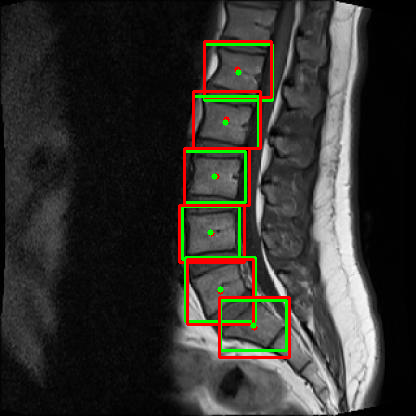

Centre of Original Label 
 246.0 95.5
Centre of Predicted Label 
 246.0 96.0
Distance 
 0.5
T1_0518_S8_png_jpg.jpg: 0.9219
Centre of Original Label 
 228.5 143.5
Centre of Predicted Label 
 228.5 143.0
Distance 
 0.5
T1_0518_S8_png_jpg.jpg: 0.9234
Centre of Original Label 
 213.0 193.0
Centre of Predicted Label 
 215.0 192.5
Distance 
 2.0615528128088303
T1_0518_S8_png_jpg.jpg: 0.9245
Centre of Original Label 
 210.0 252.0
Centre of Predicted Label 
 210.5 248.0
Distance 
 4.031128874149275
T1_0518_S8_png_jpg.jpg: 0.8598
Centre of Original Label 
 224.0 302.5
Centre of Predicted Label 
 224.0 303.0
Distance 
 0.5
T1_0518_S8_png_jpg.jpg: 0.9309
Centre of Original Label 
 258.0 331.5
Centre of Predicted Label 
 254.5 331.0
Distance 
 3.5355339059327378
T1_0518_S8_png_jpg.jpg: 0.8522


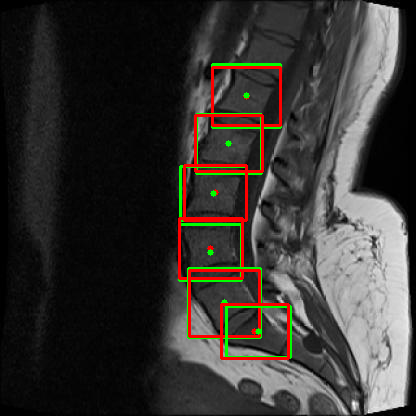

Centre of Original Label 
 276.5 79.0
Centre of Predicted Label 
 276.5 77.5
Distance 
 1.5
T1_0242_S8_png_jpg.jpg: 0.8129
Centre of Original Label 
 263.5 131.0
Centre of Predicted Label 
 267.5 129.5
Distance 
 4.272001872658765
T1_0242_S8_png_jpg.jpg: 0.7846
Centre of Original Label 
 255.0 186.0
Centre of Predicted Label 
 257.5 185.5
Distance 
 2.5495097567963922
T1_0242_S8_png_jpg.jpg: 0.7831
Centre of Original Label 
 249.5 239.5
Centre of Predicted Label 
 251.5 241.5
Distance 
 2.8284271247461903
T1_0242_S8_png_jpg.jpg: 0.7655
Centre of Original Label 
 250.0 297.0
Centre of Predicted Label 
 254.0 299.5
Distance 
 4.716990566028302
T1_0242_S8_png_jpg.jpg: 0.7360
Centre of Original Label 
 266.5 344.5
Centre of Predicted Label 
 269.5 345.0
Distance 
 3.0413812651491097
T1_0242_S8_png_jpg.jpg: 0.7269


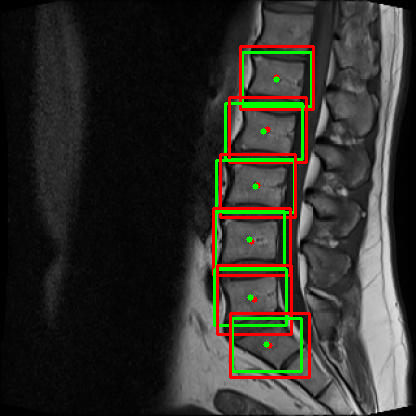

Centre of Original Label 
 261.5 69.0
Centre of Predicted Label 
 261.0 69.0
Distance 
 0.5
T1_0267_S8_png_jpg.jpg: 0.8558
Centre of Original Label 
 247.5 118.5
Centre of Predicted Label 
 249.5 117.0
Distance 
 2.5
T1_0267_S8_png_jpg.jpg: 0.8976
Centre of Original Label 
 233.0 169.5
Centre of Predicted Label 
 235.5 169.5
Distance 
 2.5
T1_0267_S8_png_jpg.jpg: 0.7840
Centre of Original Label 
 223.5 227.5
Centre of Predicted Label 
 226.0 226.5
Distance 
 2.692582403567252
T1_0267_S8_png_jpg.jpg: 0.7903
Centre of Original Label 
 227.5 285.5
Centre of Predicted Label 
 229.0 284.0
Distance 
 2.1213203435596424
T1_0267_S8_png_jpg.jpg: 0.7492
Centre of Original Label 
 258.0 327.5
Centre of Predicted Label 
 258.0 327.0
Distance 
 0.5
T1_0267_S8_png_jpg.jpg: 0.8715


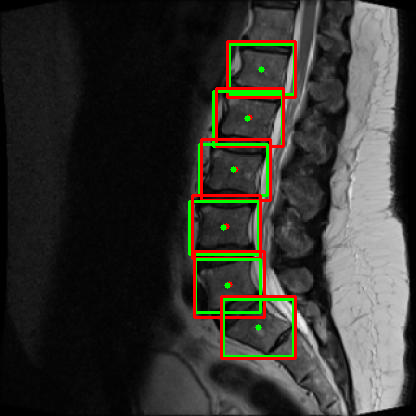

Centre of Original Label 
 246.5 68.0
Centre of Predicted Label 
 248.0 68.0
Distance 
 1.5
T1_0029_S7_png_jpg.jpg: 0.9251
Centre of Original Label 
 231.0 113.5
Centre of Predicted Label 
 231.5 114.0
Distance 
 0.7071067811865476
T1_0029_S7_png_jpg.jpg: 0.9676
Centre of Original Label 
 214.5 160.5
Centre of Predicted Label 
 214.5 160.5
Distance 
 0.0
T1_0029_S7_png_jpg.jpg: 1.0000
Centre of Original Label 
 199.5 209.0
Centre of Predicted Label 
 201.5 212.5
Distance 
 4.031128874149275
T1_0029_S7_png_jpg.jpg: 0.8333
Centre of Original Label 
 193.0 264.0
Centre of Predicted Label 
 193.5 267.0
Distance 
 3.0413812651491097
T1_0029_S7_png_jpg.jpg: 0.8803
Centre of Original Label 
 201.0 311.0
Centre of Predicted Label 
 199.5 313.5
Distance 
 2.9154759474226504
T1_0029_S7_png_jpg.jpg: 0.7664


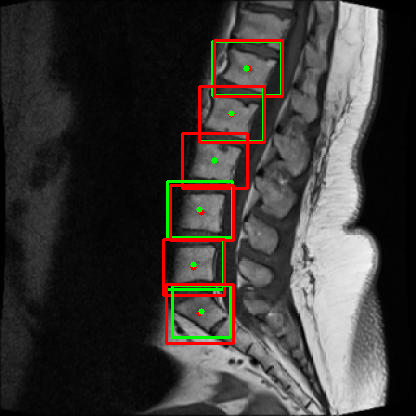

Centre of Original Label 
 269.0 87.5
Centre of Predicted Label 
 268.5 87.5
Distance 
 0.5
T1_0120_S8_png_jpg.jpg: 0.8901
Centre of Original Label 
 257.5 138.5
Centre of Predicted Label 
 257.0 137.5
Distance 
 1.118033988749895
T1_0120_S8_png_jpg.jpg: 0.9502
Centre of Original Label 
 244.5 189.0
Centre of Predicted Label 
 245.0 189.0
Distance 
 0.5
T1_0120_S8_png_jpg.jpg: 0.8327
Centre of Original Label 
 234.5 247.5
Centre of Predicted Label 
 234.0 244.5
Distance 
 3.0413812651491097
T1_0120_S8_png_jpg.jpg: 0.8598
Centre of Original Label 
 236.0 302.5
Centre of Predicted Label 
 239.0 301.0
Distance 
 3.3541019662496847
T1_0120_S8_png_jpg.jpg: 0.8703
Centre of Original Label 
 265.0 336.0
Centre of Predicted Label 
 267.0 339.0
Distance 
 3.605551275463989
T1_0120_S8_png_jpg.jpg: 0.7625


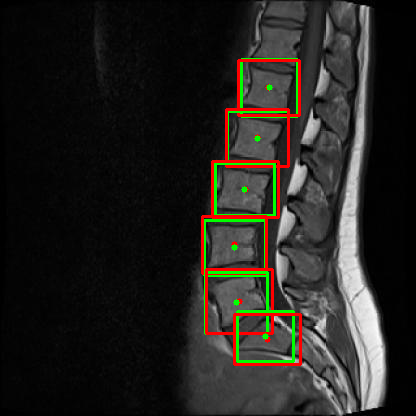

237 28 301 82
234 26 303 83
Centre of Original Label 
 269.0 55.0
Centre of Predicted Label 
 268.5 54.5
Distance 
 0.7071067811865476
T1_0332_S8_png_jpg.jpg: 0.8805
224 83 296 138
227 79 297 137
Centre of Original Label 
 260.0 110.5
Centre of Predicted Label 
 262.0 108.0
Distance 
 3.2015621187164243
T1_0332_S8_png_jpg.jpg: 0.8697
213 138 287 191
216 135 288 194
Centre of Original Label 
 250.0 164.5
Centre of Predicted Label 
 252.0 164.5
Distance 
 2.0
T1_0332_S8_png_jpg.jpg: 0.8560
212 195 280 251
212 192 282 253
Centre of Original Label 
 246.0 223.0
Centre of Predicted Label 
 247.0 222.5
Distance 
 1.118033988749895
T1_0332_S8_png_jpg.jpg: 0.8935
219 255 280 316
215 251 285 320
Centre of Original Label 
 249.5 285.5
Centre of Predicted Label 
 250.0 285.5
Distance 
 0.5
T1_0332_S8_png_jpg.jpg: 0.7734
235 301 308 366
234 301 310 370
Centre of Original Label 
 271.5 333.5
Centre of Predicted Label 
 272.0 335.5
Distance 
 2.0615528128088303
T1_0332_S8_png_jpg.jpg: 0.9061


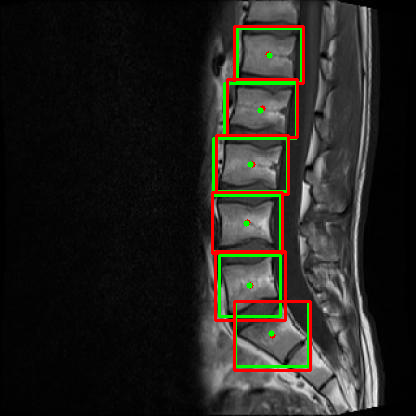

Centre of Original Label 
 257.0 61.5
Centre of Predicted Label 
 258.5 63.0
Distance 
 2.1213203435596424
T1_0145_S8_png_jpg.jpg: 0.9119
Centre of Original Label 
 245.0 115.0
Centre of Predicted Label 
 246.5 114.5
Distance 
 1.5811388300841898
T1_0145_S8_png_jpg.jpg: 0.9444
Centre of Original Label 
 232.0 169.0
Centre of Predicted Label 
 231.5 168.5
Distance 
 0.7071067811865476
T1_0145_S8_png_jpg.jpg: 0.9069
Centre of Original Label 
 222.0 225.0
Centre of Predicted Label 
 221.0 227.0
Distance 
 2.23606797749979
T1_0145_S8_png_jpg.jpg: 0.8881
Centre of Original Label 
 221.0 286.0
Centre of Predicted Label 
 219.5 287.0
Distance 
 1.8027756377319946
T1_0145_S8_png_jpg.jpg: 0.9315
Centre of Original Label 
 239.0 330.5
Centre of Predicted Label 
 241.0 333.5
Distance 
 3.605551275463989
T1_0145_S8_png_jpg.jpg: 0.8448


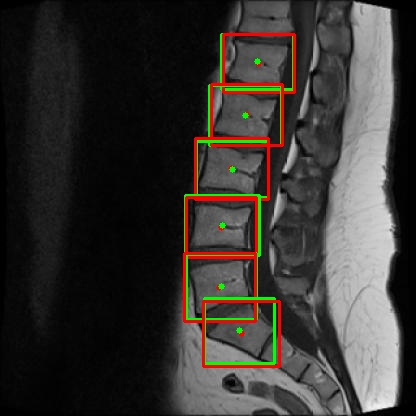

Centre of Original Label 
 324.0 74.0
Centre of Predicted Label 
 320.5 75.5
Distance 
 3.8078865529319543
T1_0223_S7_png_jpg.jpg: 0.8651
Centre of Original Label 
 300.0 123.5
Centre of Predicted Label 
 301.0 123.0
Distance 
 1.118033988749895
T1_0223_S7_png_jpg.jpg: 0.8428
Centre of Original Label 
 282.0 179.5
Centre of Predicted Label 
 283.5 176.5
Distance 
 3.3541019662496847
T1_0223_S7_png_jpg.jpg: 0.8704
Centre of Original Label 
 269.0 236.5
Centre of Predicted Label 
 269.0 233.5
Distance 
 3.0
T1_0223_S7_png_jpg.jpg: 0.8582
Centre of Original Label 
 263.5 295.0
Centre of Predicted Label 
 266.5 296.0
Distance 
 3.1622776601683795
T1_0223_S7_png_jpg.jpg: 0.8645
Centre of Original Label 
 289.0 343.5
Centre of Predicted Label 
 290.0 342.5
Distance 
 1.4142135623730951
T1_0223_S7_png_jpg.jpg: 0.9437


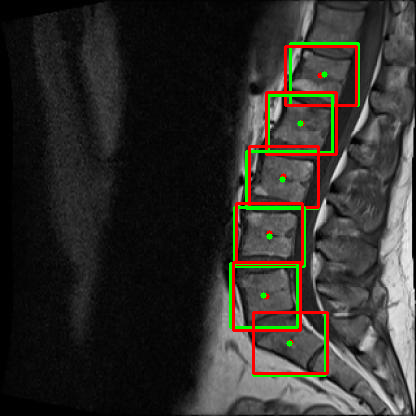

Centre of Original Label 
 284.5 74.5
Centre of Predicted Label 
 285.0 73.0
Distance 
 1.5811388300841898
T1_0023_S8_png_jpg.jpg: 0.8346
Centre of Original Label 
 275.0 121.5
Centre of Predicted Label 
 275.5 121.0
Distance 
 0.7071067811865476
T1_0023_S8_png_jpg.jpg: 0.9321
Centre of Original Label 
 261.5 174.5
Centre of Predicted Label 
 266.0 173.5
Distance 
 4.6097722286464435
T1_0023_S8_png_jpg.jpg: 0.8181
Centre of Original Label 
 255.5 231.5
Centre of Predicted Label 
 256.0 230.0
Distance 
 1.5811388300841898
T1_0023_S8_png_jpg.jpg: 0.9350
Centre of Original Label 
 247.5 284.5
Centre of Predicted Label 
 250.5 285.0
Distance 
 3.0413812651491097
T1_0023_S8_png_jpg.jpg: 0.8642
Centre of Original Label 
 253.5 331.5
Centre of Predicted Label 
 253.0 333.5
Distance 
 2.0615528128088303
T1_0023_S8_png_jpg.jpg: 0.8571


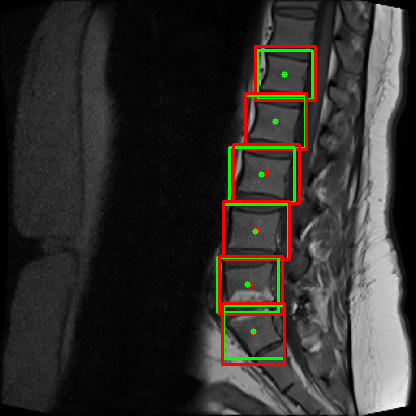

Centre of Original Label 
 193.0 108.5
Centre of Predicted Label 
 193.5 111.0
Distance 
 2.5495097567963922
T1_0143_S8_png_jpg.jpg: 0.9065
Centre of Original Label 
 178.0 157.5
Centre of Predicted Label 
 177.5 159.0
Distance 
 1.5811388300841898
T1_0143_S8_png_jpg.jpg: 0.9352
Centre of Original Label 
 164.5 212.5
Centre of Predicted Label 
 164.0 211.5
Distance 
 1.118033988749895
T1_0143_S8_png_jpg.jpg: 0.9235
Centre of Original Label 
 159.0 267.5
Centre of Predicted Label 
 160.0 267.5
Distance 
 1.0
T1_0143_S8_png_jpg.jpg: 0.8463
Centre of Original Label 
 171.5 320.5
Centre of Predicted Label 
 169.0 322.5
Distance 
 3.2015621187164243
T1_0143_S8_png_jpg.jpg: 0.8791
Centre of Original Label 
 202.0 354.0
Centre of Predicted Label 
 201.0 353.0
Distance 
 1.4142135623730951
T1_0143_S8_png_jpg.jpg: 0.9043


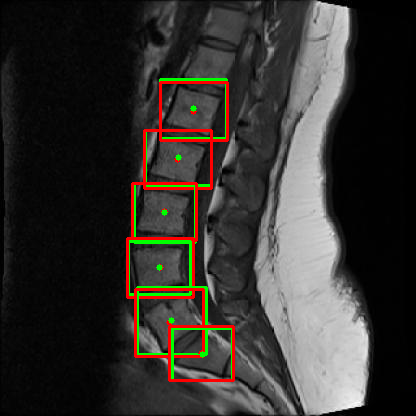

Centre of Original Label 
 273.0 87.0
Centre of Predicted Label 
 274.0 86.5
Distance 
 1.118033988749895
T1_0495_S8_png_jpg.jpg: 0.9171
Centre of Original Label 
 266.0 134.5
Centre of Predicted Label 
 268.0 134.0
Distance 
 2.0615528128088303
T1_0495_S8_png_jpg.jpg: 0.8813
Centre of Original Label 
 261.0 184.0
Centre of Predicted Label 
 262.0 184.5
Distance 
 1.118033988749895
T1_0495_S8_png_jpg.jpg: 0.9185
Centre of Original Label 
 261.5 236.0
Centre of Predicted Label 
 265.0 235.0
Distance 
 3.640054944640259
T1_0495_S8_png_jpg.jpg: 0.8290
Centre of Original Label 
 274.0 288.5
Centre of Predicted Label 
 276.5 288.5
Distance 
 2.5
T1_0495_S8_png_jpg.jpg: 0.7863
Centre of Original Label 
 306.0 320.0
Centre of Predicted Label 
 308.0 319.0
Distance 
 2.23606797749979
T1_0495_S8_png_jpg.jpg: 0.8738


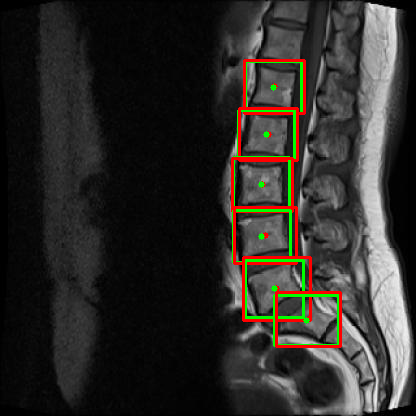

-1

In [ ]:
import cv2
j=0
kilo=[]
x_coordinates=[]
x_coordinates_o=[]
y_coordinates=[]
y_coordinates_o=[]
Eu_dist=[]
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i]), int(ymn_o[i]), int(xmx_o[i]), int(ymx_o[i])], [int(xmn_p[i]),int(ymn_p[i]),int(xmx_p[i]),int(ymx_p[i])] ) ]
  xCenter = np.divide((int(xmn_p[i])) + (int(xmx_p[i])), 2)
  yCenter = np.divide((int(ymn_p[i])) + (int(ymx_p[i])) , 2)
  xCenter_o = np.divide((int(xmn_o[i])) + (int(xmx_o[i])), 2)
  yCenter_o = np.divide((int(ymn_o[i])) + (int(ymx_o[i])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         kilo.append(iou)
         print("{}: {:.4f}".format(detection.image_path, iou))
cv2_imshow(image)
cv2.waitKey(0)
#cv2.imwrite('color.jpg',image)
#cv2.destroyAllWindows()

j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+6]), int(ymn_o[i+6]), int(xmx_o[i+6]), int(ymx_o[i+6])], [int(xmn_p[i+6]),int(ymn_p[i+6]),int(xmx_p[i+6]),int(ymx_p[i+6])] ) ]
  xCenter = np.divide((int(xmn_p[i+6])) + (int(xmx_p[i+6])), 2)
  yCenter = np.divide((int(ymn_p[i+6])) + (int(ymx_p[i+6])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+6])) + (int(xmx_o[i+6])), 2)
  yCenter_o = np.divide((int(ymn_o[i+6])) + (int(ymx_o[i+6])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0)  


j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+12]), int(ymn_o[i+12]), int(xmx_o[i+12]), int(ymx_o[i+12])], [int(xmn_p[i+12]),int(ymn_p[i+12]),int(xmx_p[i+12]),int(ymx_p[i+12])] ) ]
  xCenter = np.divide((int(xmn_p[i+12])) + (int(xmx_p[i+12])), 2)
  yCenter = np.divide((int(ymn_p[i+12])) + (int(ymx_p[i+12])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+12])) + (int(xmx_o[i+12])), 2)
  yCenter_o = np.divide((int(ymn_o[i+12])) + (int(ymx_o[i+12])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image

######################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+18]), int(ymn_o[i+18]), int(xmx_o[i+18]), int(ymx_o[i+18])], [int(xmn_p[i+18]),int(ymn_p[i+18]),int(xmx_p[i+18]),int(ymx_p[i+18])] ) ]
  xCenter = np.divide((int(xmn_p[i+18])) + (int(xmx_p[i+18])), 2)
  yCenter = np.divide((int(ymn_p[i+18])) + (int(ymx_p[i+18])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+18])) + (int(xmx_o[i+18])), 2)
  yCenter_o = np.divide((int(ymn_o[i+18])) + (int(ymx_o[i+18])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
####################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+24]), int(ymn_o[i+24]), int(xmx_o[i+24]), int(ymx_o[i+24])], [int(xmn_p[i+24]),int(ymn_p[i+24]),int(xmx_p[i+24]),int(ymx_p[i+24])] ) ]
  xCenter = np.divide((int(xmn_p[i+24])) + (int(xmx_p[i+24])), 2)
  yCenter = np.divide((int(ymn_p[i+24])) + (int(ymx_p[i+24])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+24])) + (int(xmx_o[i+24])), 2)
  yCenter_o = np.divide((int(ymn_o[i+24])) + (int(ymx_o[i+24])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
##############
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+30]), int(ymn_o[i+30]), int(xmx_o[i+30]), int(ymx_o[i+30])], [int(xmn_p[i+30]),int(ymn_p[i+30]),int(xmx_p[i+30]),int(ymx_p[i+30])] ) ]
  xCenter = np.divide((int(xmn_p[i+30])) + (int(xmx_p[i+30])), 2)
  yCenter = np.divide((int(ymn_p[i+30])) + (int(ymx_p[i+30])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+30])) + (int(xmx_o[i+30])), 2)
  yCenter_o = np.divide((int(ymn_o[i+30])) + (int(ymx_o[i+30])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
#######
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+36]), int(ymn_o[i+36]), int(xmx_o[i+36]), int(ymx_o[i+36])], [int(xmn_p[i+36]),int(ymn_p[i+36]),int(xmx_p[i+36]),int(ymx_p[i+36])] ) ]
  print(xmn_o[i+36],ymn_o[i+36],xmx_o[i+36],ymx_o[i+36])
  print(xmn_p[i+36],ymn_p[i+36],xmx_p[i+36],ymx_p[i+36])
  xCenter = np.divide((int(xmn_p[i+36])) + (int(xmx_p[i+36])), 2)
  yCenter = np.divide((int(ymn_p[i+36])) + (int(ymx_p[i+36])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+36])) + (int(xmx_o[i+36])), 2)
  yCenter_o = np.divide((int(ymn_o[i+36])) + (int(ymx_o[i+36])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
###########
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+42]), int(ymn_o[i+42]), int(xmx_o[i+42]), int(ymx_o[i+42])], [int(xmn_p[i+42]),int(ymn_p[i+42]),int(xmx_p[i+42]),int(ymx_p[i+42])] ) ]
  xCenter = np.divide((int(xmn_p[i+42])) + (int(xmx_p[i+42])), 2)
  yCenter = np.divide((int(ymn_p[i+42])) + (int(ymx_p[i+42])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+42])) + (int(xmx_o[i+42])), 2)
  yCenter_o = np.divide((int(ymn_o[i+42])) + (int(ymx_o[i+42])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
#########
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+48]), int(ymn_o[i+48]), int(xmx_o[i+48]), int(ymx_o[i+48])], [int(xmn_p[i+48]),int(ymn_p[i+48]),int(xmx_p[i+48]),int(ymx_p[i+48])] ) ]
  xCenter = np.divide((int(xmn_p[i+48])) + (int(xmx_p[i+48])), 2)
  yCenter = np.divide((int(ymn_p[i+48])) + (int(ymx_p[i+48])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+48])) + (int(xmx_o[i+48])), 2)
  yCenter_o = np.divide((int(ymn_o[i+48])) + (int(ymx_o[i+48])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
##############
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+54]), int(ymn_o[i+54]), int(xmx_o[i+54]), int(ymx_o[i+54])], [int(xmn_p[i+54]),int(ymn_p[i+54]),int(xmx_p[i+54]),int(ymx_p[i+54])] ) ]
  xCenter = np.divide((int(xmn_p[i+54])) + (int(xmx_p[i+54])), 2)
  yCenter = np.divide((int(ymn_p[i+54])) + (int(ymx_p[i+54])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+54])) + (int(xmx_o[i+54])), 2)
  yCenter_o = np.divide((int(ymn_o[i+54])) + (int(ymx_o[i+54])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
#############
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+60]), int(ymn_o[i+60]), int(xmx_o[i+60]), int(ymx_o[i+60])], [int(xmn_p[i+60]),int(ymn_p[i+60]),int(xmx_p[i+60]),int(ymx_p[i+60])] ) ]
  xCenter = np.divide((int(xmn_p[i+60])) + (int(xmx_p[i+60])), 2)
  yCenter = np.divide((int(ymn_p[i+60])) + (int(ymx_p[i+60])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+60])) + (int(xmx_o[i+60])), 2)
  yCenter_o = np.divide((int(ymn_o[i+60])) + (int(ymx_o[i+60])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+66]), int(ymn_o[i+66]), int(xmx_o[i+66]), int(ymx_o[i+66])], [int(xmn_p[i+66]),int(ymn_p[i+66]),int(xmx_p[i+66]),int(ymx_p[i+66])] ) ]
  xCenter = np.divide((int(xmn_p[i+66])) + (int(xmx_p[i+66])), 2)
  yCenter = np.divide((int(ymn_p[i+66])) + (int(ymx_p[i+66])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+66])) + (int(xmx_o[i+66])), 2)
  yCenter_o = np.divide((int(ymn_o[i+66])) + (int(ymx_o[i+66])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


In [ ]:
j

11

Centre of Original Label 
 263.0 58.5
Centre of Predicted Label 
 264.5 59.0
Distance 
 1.5811388300841898
T1_0350_S8_png_jpg.jpg: 0.9108
Centre of Original Label 
 254.5 115.5
Centre of Predicted Label 
 256.0 115.0
Distance 
 1.5811388300841898
T1_0350_S8_png_jpg.jpg: 0.8803
Centre of Original Label 
 247.5 174.0
Centre of Predicted Label 
 250.0 171.5
Distance 
 3.5355339059327378
T1_0350_S8_png_jpg.jpg: 0.8621
Centre of Original Label 
 242.5 234.5
Centre of Predicted Label 
 244.0 234.0
Distance 
 1.5811388300841898
T1_0350_S8_png_jpg.jpg: 0.8015
Centre of Original Label 
 243.5 296.5
Centre of Predicted Label 
 243.5 296.5
Distance 
 0.0
T1_0350_S8_png_jpg.jpg: 0.8874
Centre of Original Label 
 260.0 340.0
Centre of Predicted Label 
 261.0 344.5
Distance 
 4.6097722286464435
T1_0350_S8_png_jpg.jpg: 0.8346


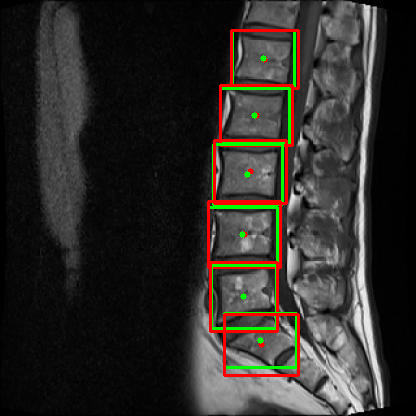

Centre of Original Label 
 228.0 87.5
Centre of Predicted Label 
 227.5 87.5
Distance 
 0.5
T1_0118_S8_png_jpg.jpg: 0.8979
Centre of Original Label 
 216.0 141.5
Centre of Predicted Label 
 219.0 140.5
Distance 
 3.1622776601683795
T1_0118_S8_png_jpg.jpg: 0.8883
Centre of Original Label 
 209.5 199.0
Centre of Predicted Label 
 211.5 197.5
Distance 
 2.5
T1_0118_S8_png_jpg.jpg: 0.9041
Centre of Original Label 
 208.5 255.0
Centre of Predicted Label 
 209.5 255.0
Distance 
 1.0
T1_0118_S8_png_jpg.jpg: 0.9737
Centre of Original Label 
 212.0 305.0
Centre of Predicted Label 
 212.5 307.5
Distance 
 2.5495097567963922
T1_0118_S8_png_jpg.jpg: 0.8656
Centre of Original Label 
 230.0 347.0
Centre of Predicted Label 
 232.0 349.0
Distance 
 2.8284271247461903
T1_0118_S8_png_jpg.jpg: 0.7634


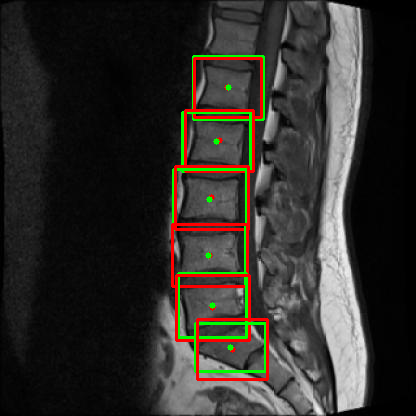

Centre of Original Label 
 271.5 72.0
Centre of Predicted Label 
 271.5 72.0
Distance 
 0.0
T1_0301_S8_png_jpg.jpg: 0.8439
Centre of Original Label 
 260.0 127.0
Centre of Predicted Label 
 262.0 123.0
Distance 
 4.47213595499958
T1_0301_S8_png_jpg.jpg: 0.8240
Centre of Original Label 
 251.5 182.0
Centre of Predicted Label 
 252.0 181.0
Distance 
 1.118033988749895
T1_0301_S8_png_jpg.jpg: 0.7848
Centre of Original Label 
 249.0 236.0
Centre of Predicted Label 
 250.5 237.5
Distance 
 2.1213203435596424
T1_0301_S8_png_jpg.jpg: 0.7404
Centre of Original Label 
 256.0 294.5
Centre of Predicted Label 
 257.0 294.5
Distance 
 1.0
T1_0301_S8_png_jpg.jpg: 0.8861
Centre of Original Label 
 284.0 330.5
Centre of Predicted Label 
 284.0 333.0
Distance 
 2.5
T1_0301_S8_png_jpg.jpg: 0.9167


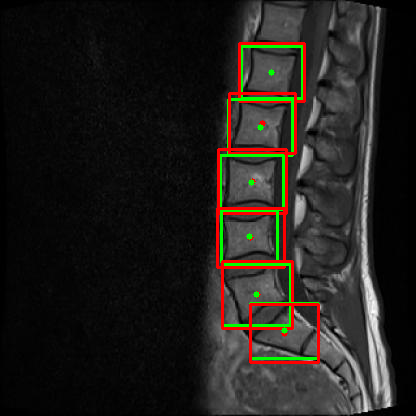

Centre of Original Label 
 253.0 53.5
Centre of Predicted Label 
 253.5 53.5
Distance 
 0.5
T1_0306_S8_png_jpg.jpg: 0.8705
Centre of Original Label 
 247.0 109.5
Centre of Predicted Label 
 247.5 107.0
Distance 
 2.5495097567963922
T1_0306_S8_png_jpg.jpg: 0.9078
Centre of Original Label 
 235.5 167.0
Centre of Predicted Label 
 236.0 164.0
Distance 
 3.0413812651491097
T1_0306_S8_png_jpg.jpg: 0.8740
Centre of Original Label 
 226.0 225.5
Centre of Predicted Label 
 224.0 222.0
Distance 
 4.031128874149275
T1_0306_S8_png_jpg.jpg: 0.8471
Centre of Original Label 
 220.0 286.5
Centre of Predicted Label 
 220.0 286.5
Distance 
 0.0
T1_0306_S8_png_jpg.jpg: 0.9147
Centre of Original Label 
 243.0 332.0
Centre of Predicted Label 
 241.0 335.5
Distance 
 4.031128874149275
T1_0306_S8_png_jpg.jpg: 0.7863


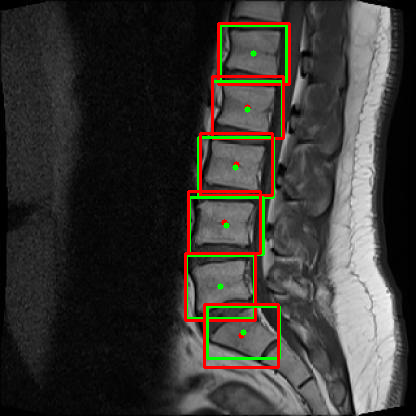

-1

In [ ]:
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+72]), int(ymn_o[i+72]), int(xmx_o[i+72]), int(ymx_o[i+72])], [int(xmn_p[i+72]),int(ymn_p[i+72]),int(xmx_p[i+72]),int(ymx_p[i+72])] ) ]
  xCenter = np.divide((int(xmn_p[i+72])) + (int(xmx_p[i+72])), 2)
  yCenter = np.divide((int(ymn_p[i+72])) + (int(ymx_p[i+72])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+72])) + (int(xmx_o[i+72])), 2)
  yCenter_o = np.divide((int(ymn_o[i+72])) + (int(ymx_o[i+72])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image

#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+78]), int(ymn_o[i+78]), int(xmx_o[i+78]), int(ymx_o[i+78])], [int(xmn_p[i+78]),int(ymn_p[i+78]),int(xmx_p[i+78]),int(ymx_p[i+78])] ) ]
  xCenter = np.divide((int(xmn_p[i+78])) + (int(xmx_p[i+78])), 2)
  yCenter = np.divide((int(ymn_p[i+78])) + (int(ymx_p[i+78])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+78])) + (int(xmx_o[i+78])), 2)
  yCenter_o = np.divide((int(ymn_o[i+78])) + (int(ymx_o[i+78])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image

#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+84]), int(ymn_o[i+84]), int(xmx_o[i+84]), int(ymx_o[i+84])], [int(xmn_p[i+84]),int(ymn_p[i+84]),int(xmx_p[i+84]),int(ymx_p[i+84])] ) ]
  xCenter = np.divide((int(xmn_p[i+84])) + (int(xmx_p[i+84])), 2)
  yCenter = np.divide((int(ymn_p[i+84])) + (int(ymx_p[i+84])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+84])) + (int(xmx_o[i+84])), 2)
  yCenter_o = np.divide((int(ymn_o[i+84])) + (int(ymx_o[i+84])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+90]), int(ymn_o[i+90]), int(xmx_o[i+90]), int(ymx_o[i+90])], [int(xmn_p[i+90]),int(ymn_p[i+90]),int(xmx_p[i+90]),int(ymx_p[i+90])] ) ]
  xCenter = np.divide((int(xmn_p[i+90])) + (int(xmx_p[i+90])), 2)
  yCenter = np.divide((int(ymn_p[i+90])) + (int(ymx_p[i+90])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+90])) + (int(xmx_o[i+90])), 2)
  yCenter_o = np.divide((int(ymn_o[i+90])) + (int(ymx_o[i+90])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image



In [ ]:
j

15

Centre of Original Label 
 234.5 58.5
Centre of Predicted Label 
 236.5 57.5
Distance 
 2.23606797749979
T1_0083_S8_png_jpg.jpg: 0.7059
Centre of Original Label 
 227.5 113.5
Centre of Predicted Label 
 229.5 110.5
Distance 
 3.605551275463989
T1_0083_S8_png_jpg.jpg: 0.6512
Centre of Original Label 
 222.0 171.5
Centre of Predicted Label 
 223.5 166.0
Distance 
 5.70087712549569
T1_0083_S8_png_jpg.jpg: 0.6923
Centre of Original Label 
 221.0 228.5
Centre of Predicted Label 
 220.5 227.0
Distance 
 1.5811388300841898
T1_0083_S8_png_jpg.jpg: 0.7846
Centre of Original Label 
 222.5 283.0
Centre of Predicted Label 
 220.0 285.0
Distance 
 3.2015621187164243
T1_0083_S8_png_jpg.jpg: 0.8508
Centre of Original Label 
 235.0 326.5
Centre of Predicted Label 
 236.0 330.5
Distance 
 4.123105625617661
T1_0083_S8_png_jpg.jpg: 0.7752


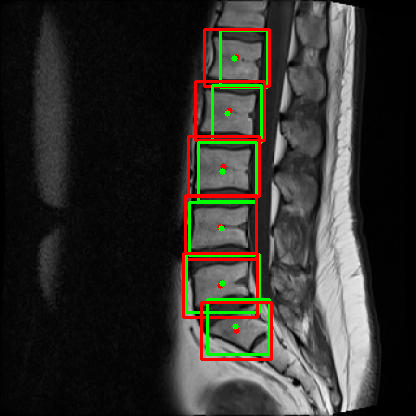

Centre of Original Label 
 257.0 71.0
Centre of Predicted Label 
 258.0 68.5
Distance 
 2.692582403567252
T1_0166_S8_png_jpg.jpg: 0.8893
Centre of Original Label 
 253.5 119.0
Centre of Predicted Label 
 252.0 118.5
Distance 
 1.5811388300841898
T1_0166_S8_png_jpg.jpg: 0.8411
Centre of Original Label 
 242.5 171.5
Centre of Predicted Label 
 244.5 172.5
Distance 
 2.23606797749979
T1_0166_S8_png_jpg.jpg: 0.8250
Centre of Original Label 
 234.5 227.5
Centre of Predicted Label 
 234.5 226.0
Distance 
 1.5
T1_0166_S8_png_jpg.jpg: 0.8630
Centre of Original Label 
 231.5 285.5
Centre of Predicted Label 
 229.5 285.5
Distance 
 2.0
T1_0166_S8_png_jpg.jpg: 0.7955
Centre of Original Label 
 246.5 334.0
Centre of Predicted Label 
 246.5 335.5
Distance 
 1.5
T1_0166_S8_png_jpg.jpg: 0.7596


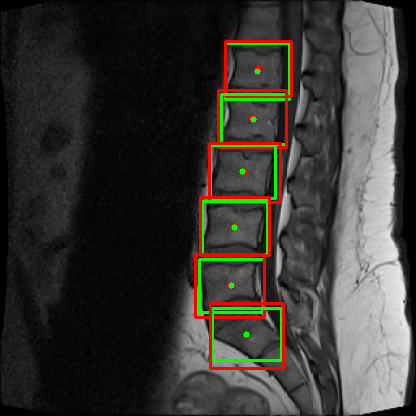

Centre of Original Label 
 260.0 79.0
Centre of Predicted Label 
 260.5 79.5
Distance 
 0.7071067811865476
T1_0431_S8_png_jpg.jpg: 0.9049
Centre of Original Label 
 247.0 131.5
Centre of Predicted Label 
 248.0 129.5
Distance 
 2.23606797749979
T1_0431_S8_png_jpg.jpg: 0.8597
Centre of Original Label 
 232.0 184.0
Centre of Predicted Label 
 231.5 183.0
Distance 
 1.118033988749895
T1_0431_S8_png_jpg.jpg: 0.8826
Centre of Original Label 
 224.0 244.0
Centre of Predicted Label 
 223.5 243.0
Distance 
 1.118033988749895
T1_0431_S8_png_jpg.jpg: 0.8247
Centre of Original Label 
 234.5 297.0
Centre of Predicted Label 
 232.5 298.5
Distance 
 2.5
T1_0431_S8_png_jpg.jpg: 0.8856
Centre of Original Label 
 267.0 342.0
Centre of Predicted Label 
 264.0 346.0
Distance 
 5.0
T1_0431_S8_png_jpg.jpg: 0.8110


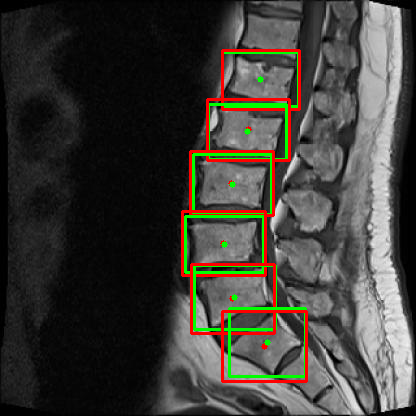

Centre of Original Label 
 288.5 84.0
Centre of Predicted Label 
 291.5 84.5
Distance 
 3.0413812651491097
T1_0098_S8_png_jpg.jpg: 0.8913
Centre of Original Label 
 276.0 128.5
Centre of Predicted Label 
 277.0 129.5
Distance 
 1.4142135623730951
T1_0098_S8_png_jpg.jpg: 0.9347
Centre of Original Label 
 258.0 172.5
Centre of Predicted Label 
 261.5 178.0
Distance 
 6.519202405202649
T1_0098_S8_png_jpg.jpg: 0.7300
Centre of Original Label 
 245.0 223.5
Centre of Predicted Label 
 247.0 228.0
Distance 
 4.924428900898052
T1_0098_S8_png_jpg.jpg: 0.8104
Centre of Original Label 
 236.0 271.0
Centre of Predicted Label 
 241.5 280.5
Distance 
 10.977249200050075
T1_0098_S8_png_jpg.jpg: 0.5944
Centre of Original Label 
 257.5 322.5
Centre of Predicted Label 
 256.0 325.0
Distance 
 2.9154759474226504
T1_0098_S8_png_jpg.jpg: 0.7394


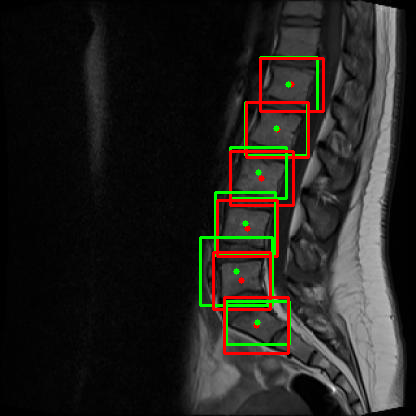

Centre of Original Label 
 232.5 84.0
Centre of Predicted Label 
 234.5 85.0
Distance 
 2.23606797749979
T1_0281_S8_png_jpg.jpg: 0.8649
Centre of Original Label 
 226.5 135.5
Centre of Predicted Label 
 228.0 133.5
Distance 
 2.5
T1_0281_S8_png_jpg.jpg: 0.8799
Centre of Original Label 
 224.5 185.0
Centre of Predicted Label 
 226.5 183.5
Distance 
 2.5
T1_0281_S8_png_jpg.jpg: 0.8885
Centre of Original Label 
 234.5 231.0
Centre of Predicted Label 
 236.0 231.0
Distance 
 1.5
T1_0281_S8_png_jpg.jpg: 0.8603
Centre of Original Label 
 251.5 276.5
Centre of Predicted Label 
 251.0 277.0
Distance 
 0.7071067811865476
T1_0281_S8_png_jpg.jpg: 0.8268
Centre of Original Label 
 278.0 310.5
Centre of Predicted Label 
 279.0 314.0
Distance 
 3.640054944640259
T1_0281_S8_png_jpg.jpg: 0.8582


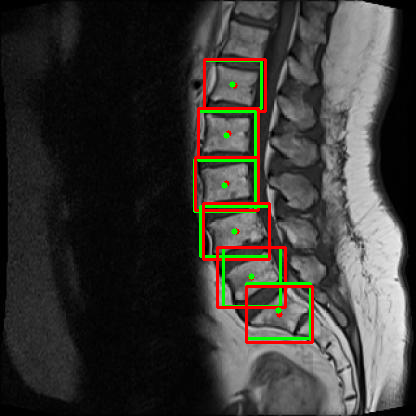

Centre of Original Label 
 265.0 76.5
Centre of Predicted Label 
 265.0 76.0
Distance 
 0.5
T1_0314_S8_png_jpg.jpg: 0.8358
Centre of Original Label 
 253.5 133.0
Centre of Predicted Label 
 254.0 130.5
Distance 
 2.5495097567963922
T1_0314_S8_png_jpg.jpg: 0.9064
Centre of Original Label 
 240.0 190.5
Centre of Predicted Label 
 243.0 188.5
Distance 
 3.605551275463989
T1_0314_S8_png_jpg.jpg: 0.8604
Centre of Original Label 
 241.0 250.0
Centre of Predicted Label 
 241.0 249.5
Distance 
 0.5
T1_0314_S8_png_jpg.jpg: 0.9531
Centre of Original Label 
 257.0 307.5
Centre of Predicted Label 
 256.5 308.5
Distance 
 1.118033988749895
T1_0314_S8_png_jpg.jpg: 0.9594
Centre of Original Label 
 293.0 340.0
Centre of Predicted Label 
 295.5 341.0
Distance 
 2.692582403567252
T1_0314_S8_png_jpg.jpg: 0.7560


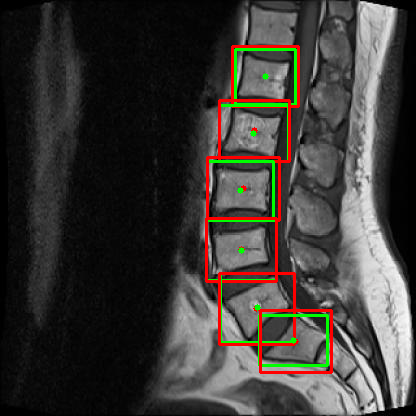

Centre of Original Label 
 225.5 78.5
Centre of Predicted Label 
 227.5 79.5
Distance 
 2.23606797749979
T1_0475_S8_png_jpg.jpg: 0.9071
Centre of Original Label 
 206.5 128.5
Centre of Predicted Label 
 209.0 128.0
Distance 
 2.5495097567963922
T1_0475_S8_png_jpg.jpg: 0.8839
Centre of Original Label 
 189.5 175.5
Centre of Predicted Label 
 193.0 176.5
Distance 
 3.640054944640259
T1_0475_S8_png_jpg.jpg: 0.8449
Centre of Original Label 
 173.0 229.5
Centre of Predicted Label 
 176.0 226.5
Distance 
 4.242640687119285
T1_0475_S8_png_jpg.jpg: 0.8219
Centre of Original Label 
 168.5 286.0
Centre of Predicted Label 
 168.0 285.0
Distance 
 1.118033988749895
T1_0475_S8_png_jpg.jpg: 0.8899
Centre of Original Label 
 190.0 330.0
Centre of Predicted Label 
 191.5 331.0
Distance 
 1.8027756377319946
T1_0475_S8_png_jpg.jpg: 0.8894


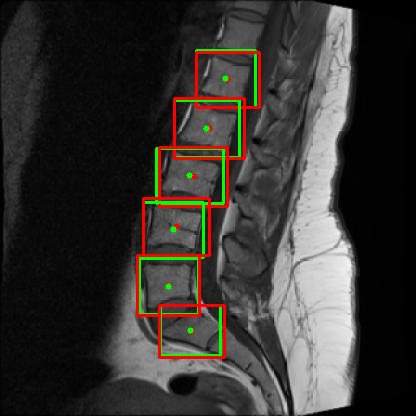

Centre of Original Label 
 266.0 46.5
Centre of Predicted Label 
 268.0 46.0
Distance 
 2.0615528128088303
T1_0532_S8_png_jpg.jpg: 0.8877
Centre of Original Label 
 254.5 91.0
Centre of Predicted Label 
 254.5 92.0
Distance 
 1.0
T1_0532_S8_png_jpg.jpg: 0.9636
Centre of Original Label 
 242.0 139.0
Centre of Predicted Label 
 243.0 140.0
Distance 
 1.4142135623730951
T1_0532_S8_png_jpg.jpg: 0.8702
Centre of Original Label 
 234.0 189.0
Centre of Predicted Label 
 233.0 189.0
Distance 
 1.0
T1_0532_S8_png_jpg.jpg: 0.9385
Centre of Original Label 
 227.5 238.5
Centre of Predicted Label 
 228.0 241.0
Distance 
 2.5495097567963922
T1_0532_S8_png_jpg.jpg: 0.8450
Centre of Original Label 
 245.5 282.0
Centre of Predicted Label 
 243.5 286.0
Distance 
 4.47213595499958
T1_0532_S8_png_jpg.jpg: 0.8050


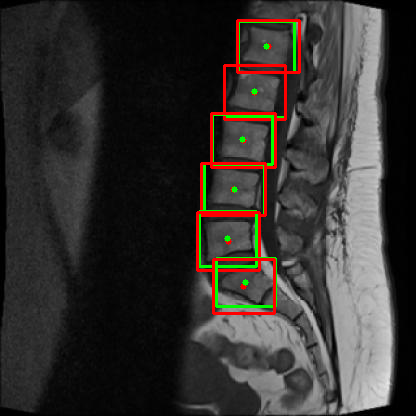

Centre of Original Label 
 269.5 69.5
Centre of Predicted Label 
 273.5 71.0
Distance 
 4.272001872658765
T1_0047_S8_png_jpg.jpg: 0.8285
Centre of Original Label 
 261.5 118.5
Centre of Predicted Label 
 263.5 120.0
Distance 
 2.5
T1_0047_S8_png_jpg.jpg: 0.9024
Centre of Original Label 
 247.0 169.5
Centre of Predicted Label 
 248.5 167.5
Distance 
 2.5
T1_0047_S8_png_jpg.jpg: 0.8977
Centre of Original Label 
 236.5 222.5
Centre of Predicted Label 
 238.5 222.5
Distance 
 2.0
T1_0047_S8_png_jpg.jpg: 0.8876
Centre of Original Label 
 239.0 284.5
Centre of Predicted Label 
 238.5 284.0
Distance 
 0.7071067811865476
T1_0047_S8_png_jpg.jpg: 0.9132
Centre of Original Label 
 262.0 327.5
Centre of Predicted Label 
 262.5 331.0
Distance 
 3.5355339059327378
T1_0047_S8_png_jpg.jpg: 0.8821


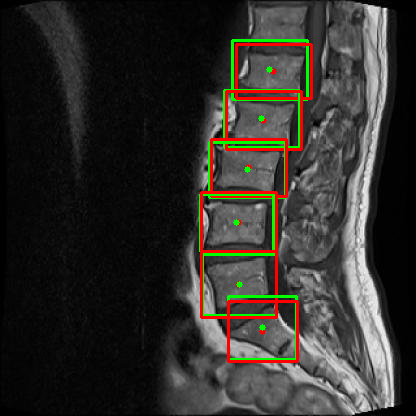

Centre of Original Label 
 253.0 70.0
Centre of Predicted Label 
 252.0 71.0
Distance 
 1.4142135623730951
T1_0012_S8_png_jpg.jpg: 0.8521
Centre of Original Label 
 236.0 123.0
Centre of Predicted Label 
 238.0 124.5
Distance 
 2.5
T1_0012_S8_png_jpg.jpg: 0.8698
Centre of Original Label 
 224.0 182.5
Centre of Predicted Label 
 225.5 181.5
Distance 
 1.8027756377319946
T1_0012_S8_png_jpg.jpg: 0.8930
Centre of Original Label 
 218.5 243.0
Centre of Predicted Label 
 219.0 243.5
Distance 
 0.7071067811865476
T1_0012_S8_png_jpg.jpg: 0.8820
Centre of Original Label 
 226.0 304.5
Centre of Predicted Label 
 224.5 307.0
Distance 
 2.9154759474226504
T1_0012_S8_png_jpg.jpg: 0.8464
Centre of Original Label 
 254.0 348.0
Centre of Predicted Label 
 252.5 351.0
Distance 
 3.3541019662496847
T1_0012_S8_png_jpg.jpg: 0.8366


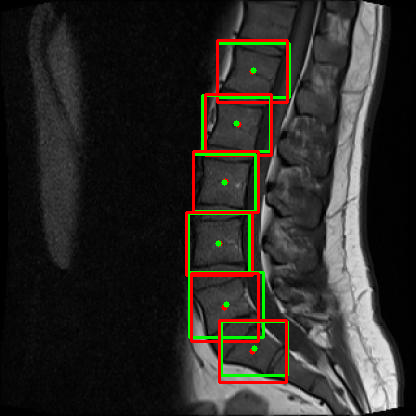

Centre of Original Label 
 270.0 55.0
Centre of Predicted Label 
 271.0 55.5
Distance 
 1.118033988749895
T1_0335_S8_png_jpg.jpg: 0.9193
Centre of Original Label 
 258.5 108.5
Centre of Predicted Label 
 260.5 109.0
Distance 
 2.0615528128088303
T1_0335_S8_png_jpg.jpg: 0.8977
Centre of Original Label 
 248.0 165.5
Centre of Predicted Label 
 249.5 164.5
Distance 
 1.8027756377319946
T1_0335_S8_png_jpg.jpg: 0.8933
Centre of Original Label 
 245.0 225.5
Centre of Predicted Label 
 245.5 225.5
Distance 
 0.5
T1_0335_S8_png_jpg.jpg: 0.9539
Centre of Original Label 
 254.0 286.0
Centre of Predicted Label 
 254.0 285.0
Distance 
 1.0
T1_0335_S8_png_jpg.jpg: 0.9171
Centre of Original Label 
 280.5 327.5
Centre of Predicted Label 
 281.5 327.5
Distance 
 1.0
T1_0335_S8_png_jpg.jpg: 0.8639


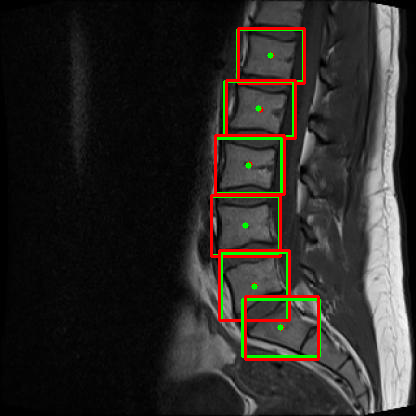

Centre of Original Label 
 273.5 89.0
Centre of Predicted Label 
 274.0 86.5
Distance 
 2.5495097567963922
T1_0519_S15_png_jpg.jpg: 0.8413
Centre of Original Label 
 253.5 137.0
Centre of Predicted Label 
 256.5 136.0
Distance 
 3.1622776601683795
T1_0519_S15_png_jpg.jpg: 0.8496
Centre of Original Label 
 239.5 190.5
Centre of Predicted Label 
 242.0 189.0
Distance 
 2.9154759474226504
T1_0519_S15_png_jpg.jpg: 0.8453
Centre of Original Label 
 232.0 245.0
Centre of Predicted Label 
 232.5 243.5
Distance 
 1.5811388300841898
T1_0519_S15_png_jpg.jpg: 0.8401
Centre of Original Label 
 232.0 302.0
Centre of Predicted Label 
 234.0 303.0
Distance 
 2.23606797749979
T1_0519_S15_png_jpg.jpg: 0.9113
Centre of Original Label 
 258.0 343.0
Centre of Predicted Label 
 259.5 340.0
Distance 
 3.3541019662496847
T1_0519_S15_png_jpg.jpg: 0.8467


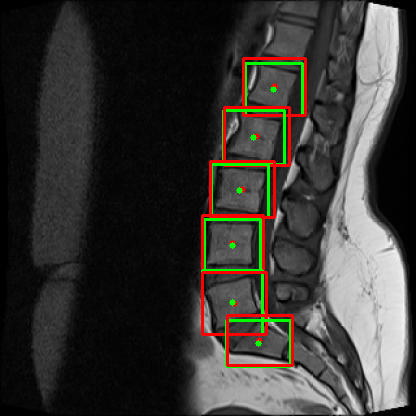

Centre of Original Label 
 275.0 37.5
Centre of Predicted Label 
 276.0 38.0
Distance 
 1.118033988749895
T1_0092_S8_png_jpg.jpg: 0.8913
Centre of Original Label 
 267.0 84.5
Centre of Predicted Label 
 266.5 86.5
Distance 
 2.0615528128088303
T1_0092_S8_png_jpg.jpg: 0.8373
Centre of Original Label 
 255.0 136.5
Centre of Predicted Label 
 256.5 136.5
Distance 
 1.5
T1_0092_S8_png_jpg.jpg: 0.8647
Centre of Original Label 
 250.5 190.0
Centre of Predicted Label 
 249.0 191.0
Distance 
 1.8027756377319946
T1_0092_S8_png_jpg.jpg: 0.9263
Centre of Original Label 
 253.0 247.0
Centre of Predicted Label 
 252.0 245.5
Distance 
 1.8027756377319946
T1_0092_S8_png_jpg.jpg: 0.9252
Centre of Original Label 
 262.0 289.0
Centre of Predicted Label 
 262.5 292.0
Distance 
 3.0413812651491097
T1_0092_S8_png_jpg.jpg: 0.8504


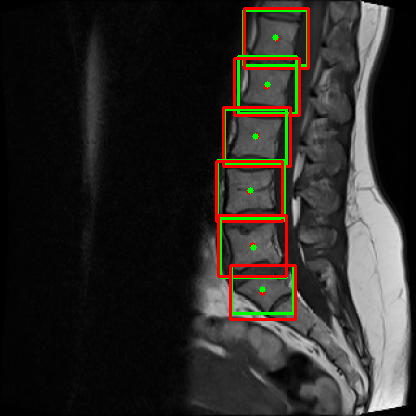

-1

In [ ]:

#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+90]), int(ymn_o[i+96]), int(xmx_o[i+96]), int(ymx_o[i+96])], [int(xmn_p[i+96]),int(ymn_p[i+96]),int(xmx_p[i+96]),int(ymx_p[i+96])] ) ]
  xCenter = np.divide((int(xmn_p[i+96])) + (int(xmx_p[i+96])), 2)
  yCenter = np.divide((int(ymn_p[i+96])) + (int(ymx_p[i+96])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+96])) + (int(xmx_o[i+96])), 2)
  yCenter_o = np.divide((int(ymn_o[i+96])) + (int(ymx_o[i+96])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image



#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+102]), int(ymn_o[i+102]), int(xmx_o[i+102]), int(ymx_o[i+102])], [int(xmn_p[i+102]),int(ymn_p[i+102]),int(xmx_p[i+102]),int(ymx_p[i+102])] ) ]
  xCenter = np.divide((int(xmn_p[i+102])) + (int(xmx_p[i+102])), 2)
  yCenter = np.divide((int(ymn_p[i+102])) + (int(ymx_p[i+102])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+102])) + (int(xmx_o[i+102])), 2)
  yCenter_o = np.divide((int(ymn_o[i+102])) + (int(ymx_o[i+102])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image






#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+108]), int(ymn_o[i+108]), int(xmx_o[i+108]), int(ymx_o[i+108])], [int(xmn_p[i+108]),int(ymn_p[i+108]),int(xmx_p[i+108]),int(ymx_p[i+108])] ) ]
  xCenter = np.divide((int(xmn_p[i+108])) + (int(xmx_p[i+108])), 2)
  yCenter = np.divide((int(ymn_p[i+108])) + (int(ymx_p[i+108])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+108])) + (int(xmx_o[i+108])), 2)
  yCenter_o = np.divide((int(ymn_o[i+108])) + (int(ymx_o[i+108])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image




#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+114]), int(ymn_o[i+114]), int(xmx_o[i+114]), int(ymx_o[i+114])], [int(xmn_p[i+114]),int(ymn_p[i+114]),int(xmx_p[i+114]),int(ymx_p[i+114])] ) ]
  xCenter = np.divide((int(xmn_p[i+114])) + (int(xmx_p[i+114])), 2)
  yCenter = np.divide((int(ymn_p[i+114])) + (int(ymx_p[i+114])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+114])) + (int(xmx_o[i+114])), 2)
  yCenter_o = np.divide((int(ymn_o[i+114])) + (int(ymx_o[i+114])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+120]), int(ymn_o[i+120]), int(xmx_o[i+120]), int(ymx_o[i+120])], [int(xmn_p[i+120]),int(ymn_p[i+120]),int(xmx_p[i+120]),int(ymx_p[i+120])] ) ]
  xCenter = np.divide((int(xmn_p[i+120])) + (int(xmx_p[i+120])), 2)
  yCenter = np.divide((int(ymn_p[i+120])) + (int(ymx_p[i+120])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+120])) + (int(xmx_o[i+120])), 2)
  yCenter_o = np.divide((int(ymn_o[i+120])) + (int(ymx_o[i+120])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+126]), int(ymn_o[i+126]), int(xmx_o[i+126]), int(ymx_o[i+126])], [int(xmn_p[i+126]),int(ymn_p[i+126]),int(xmx_p[i+126]),int(ymx_p[i+126])] ) ]
  xCenter = np.divide((int(xmn_p[i+126])) + (int(xmx_p[i+126])), 2)
  yCenter = np.divide((int(ymn_p[i+126])) + (int(ymx_p[i+126])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+126])) + (int(xmx_o[i+126])), 2)
  yCenter_o = np.divide((int(ymn_o[i+126])) + (int(ymx_o[i+126])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image



#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+132]), int(ymn_o[i+132]), int(xmx_o[i+132]), int(ymx_o[i+132])], [int(xmn_p[i+132]),int(ymn_p[i+132]),int(xmx_p[i+132]),int(ymx_p[i+132])] ) ]
  xCenter = np.divide((int(xmn_p[i+132])) + (int(xmx_p[i+132])), 2)
  yCenter = np.divide((int(ymn_p[i+132])) + (int(ymx_p[i+132])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+132])) + (int(xmx_o[i+132])), 2)
  yCenter_o = np.divide((int(ymn_o[i+132])) + (int(ymx_o[i+132])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image




#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+138]), int(ymn_o[i+138]), int(xmx_o[i+138]), int(ymx_o[i+138])], [int(xmn_p[i+138]),int(ymn_p[i+138]),int(xmx_p[i+138]),int(ymx_p[i+138])] ) ]
  xCenter = np.divide((int(xmn_p[i+138])) + (int(xmx_p[i+138])), 2)
  yCenter = np.divide((int(ymn_p[i+138])) + (int(ymx_p[i+138])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+138])) + (int(xmx_o[i+138])), 2)
  yCenter_o = np.divide((int(ymn_o[i+138])) + (int(ymx_o[i+138])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image




#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+144]), int(ymn_o[i+144]), int(xmx_o[i+144]), int(ymx_o[i+144])], [int(xmn_p[i+144]),int(ymn_p[i+144]),int(xmx_p[i+144]),int(ymx_p[i+144])] ) ]
  xCenter = np.divide((int(xmn_p[i+144])) + (int(xmx_p[i+144])), 2)
  yCenter = np.divide((int(ymn_p[i+144])) + (int(ymx_p[i+144])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+144])) + (int(xmx_o[i+144])), 2)
  yCenter_o = np.divide((int(ymn_o[i+144])) + (int(ymx_o[i+144])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+150]), int(ymn_o[i+150]), int(xmx_o[i+150]), int(ymx_o[i+150])], [int(xmn_p[i+150]),int(ymn_p[i+150]),int(xmx_p[i+150]),int(ymx_p[i+150])] ) ]
  xCenter = np.divide((int(xmn_p[i+150])) + (int(xmx_p[i+150])), 2)
  yCenter = np.divide((int(ymn_p[i+150])) + (int(ymx_p[i+150])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+150])) + (int(xmx_o[i+150])), 2)
  yCenter_o = np.divide((int(ymn_o[i+150])) + (int(ymx_o[i+150])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+156]), int(ymn_o[i+156]), int(xmx_o[i+156]), int(ymx_o[i+156])], [int(xmn_p[i+156]),int(ymn_p[i+156]),int(xmx_p[i+156]),int(ymx_p[i+156])] ) ]
  xCenter = np.divide((int(xmn_p[i+156])) + (int(xmx_p[i+156])), 2)
  yCenter = np.divide((int(ymn_p[i+156])) + (int(ymx_p[i+156])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+156])) + (int(xmx_o[i+156])), 2)
  yCenter_o = np.divide((int(ymn_o[i+156])) + (int(ymx_o[i+156])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image




#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+162]), int(ymn_o[i+162]), int(xmx_o[i+162]), int(ymx_o[i+162])], [int(xmn_p[i+162]),int(ymn_p[i+162]),int(xmx_p[i+162]),int(ymx_p[i+162])] ) ]
  xCenter = np.divide((int(xmn_p[i+162])) + (int(xmx_p[i+162])), 2)
  yCenter = np.divide((int(ymn_p[i+162])) + (int(ymx_p[i+162])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+162])) + (int(xmx_o[i+162])), 2)
  yCenter_o = np.divide((int(ymn_o[i+162])) + (int(ymx_o[i+162])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image



#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+168]), int(ymn_o[i+168]), int(xmx_o[i+168]), int(ymx_o[i+168])], [int(xmn_p[i+168]),int(ymn_p[i+168]),int(xmx_p[i+168]),int(ymx_p[i+168])] ) ]
  xCenter = np.divide((int(xmn_p[i+168])) + (int(xmx_p[i+168])), 2)
  yCenter = np.divide((int(ymn_p[i+168])) + (int(ymx_p[i+168])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+168])) + (int(xmx_o[i+168])), 2)
  yCenter_o = np.divide((int(ymn_o[i+168])) + (int(ymx_o[i+168])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image



Centre of Original Label 
 262.0 66.5
Centre of Predicted Label 
 261.5 65.5
Distance 
 1.118033988749895
T1_0537_S8_png_jpg.jpg: 0.9240
Centre of Original Label 
 245.0 114.0
Centre of Predicted Label 
 247.0 114.5
Distance 
 2.0615528128088303
T1_0537_S8_png_jpg.jpg: 0.8980
Centre of Original Label 
 229.0 168.0
Centre of Predicted Label 
 231.5 167.5
Distance 
 2.5495097567963922
T1_0537_S8_png_jpg.jpg: 0.9159
Centre of Original Label 
 219.0 223.5
Centre of Predicted Label 
 220.5 225.5
Distance 
 2.5
T1_0537_S8_png_jpg.jpg: 0.8069
Centre of Original Label 
 222.0 282.0
Centre of Predicted Label 
 224.0 282.5
Distance 
 2.0615528128088303
T1_0537_S8_png_jpg.jpg: 0.9005
Centre of Original Label 
 256.0 312.0
Centre of Predicted Label 
 254.5 315.5
Distance 
 3.8078865529319543
T1_0537_S8_png_jpg.jpg: 0.7681


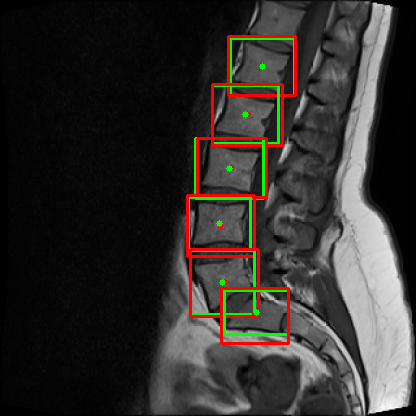

Centre of Original Label 
 290.5 121.0
Centre of Predicted Label 
 291.0 121.0
Distance 
 0.5
T1_0515_S8_png_jpg.jpg: 0.9180
Centre of Original Label 
 277.0 168.5
Centre of Predicted Label 
 278.5 169.0
Distance 
 1.5811388300841898
T1_0515_S8_png_jpg.jpg: 0.8438
Centre of Original Label 
 267.0 218.0
Centre of Predicted Label 
 268.0 219.5
Distance 
 1.8027756377319946
T1_0515_S8_png_jpg.jpg: 0.9195
Centre of Original Label 
 262.5 271.5
Centre of Predicted Label 
 266.5 274.0
Distance 
 4.716990566028302
T1_0515_S8_png_jpg.jpg: 0.8039
Centre of Original Label 
 273.0 326.5
Centre of Predicted Label 
 277.5 326.5
Distance 
 4.5
T1_0515_S8_png_jpg.jpg: 0.8732
Centre of Original Label 
 309.5 354.5
Centre of Predicted Label 
 313.5 354.5
Distance 
 4.0
T1_0515_S8_png_jpg.jpg: 0.7326


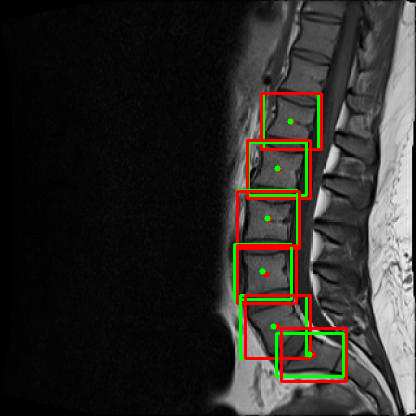

Centre of Original Label 
 245.0 82.5
Centre of Predicted Label 
 248.0 86.0
Distance 
 4.6097722286464435
T1_0069_S8_png_jpg.jpg: 0.8221
Centre of Original Label 
 234.5 140.5
Centre of Predicted Label 
 236.0 140.0
Distance 
 1.5811388300841898
T1_0069_S8_png_jpg.jpg: 0.9193
Centre of Original Label 
 224.0 198.5
Centre of Predicted Label 
 225.5 199.5
Distance 
 1.8027756377319946
T1_0069_S8_png_jpg.jpg: 0.9020
Centre of Original Label 
 222.0 262.0
Centre of Predicted Label 
 219.0 262.5
Distance 
 3.0413812651491097
T1_0069_S8_png_jpg.jpg: 0.8543
Centre of Original Label 
 237.0 320.5
Centre of Predicted Label 
 234.5 321.5
Distance 
 2.692582403567252
T1_0069_S8_png_jpg.jpg: 0.8446
Centre of Original Label 
 268.5 353.5
Centre of Predicted Label 
 267.5 355.0
Distance 
 1.8027756377319946
T1_0069_S8_png_jpg.jpg: 0.9244


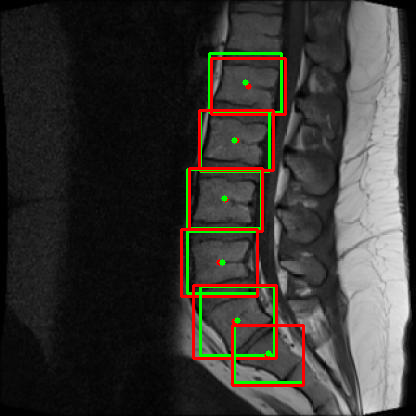

Centre of Original Label 
 252.0 59.0
Centre of Predicted Label 
 253.5 58.5
Distance 
 1.5811388300841898
T1_0468_S8_png_jpg.jpg: 0.9061
Centre of Original Label 
 243.0 111.0
Centre of Predicted Label 
 247.5 109.5
Distance 
 4.743416490252569
T1_0468_S8_png_jpg.jpg: 0.8348
Centre of Original Label 
 238.5 163.0
Centre of Predicted Label 
 240.0 162.0
Distance 
 1.8027756377319946
T1_0468_S8_png_jpg.jpg: 0.8295
Centre of Original Label 
 232.0 216.5
Centre of Predicted Label 
 231.5 215.0
Distance 
 1.5811388300841898
T1_0468_S8_png_jpg.jpg: 0.8650
Centre of Original Label 
 226.0 271.5
Centre of Predicted Label 
 227.5 272.0
Distance 
 1.5811388300841898
T1_0468_S8_png_jpg.jpg: 0.7738
Centre of Original Label 
 244.5 320.5
Centre of Predicted Label 
 245.5 322.0
Distance 
 1.8027756377319946
T1_0468_S8_png_jpg.jpg: 0.9024


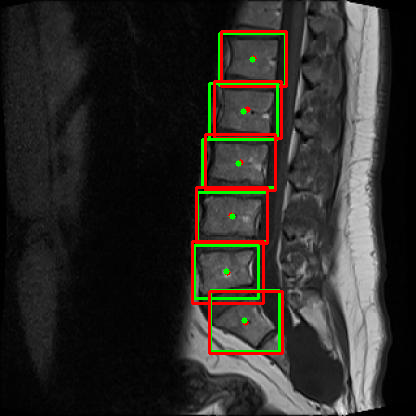

Centre of Original Label 
 283.5 80.0
Centre of Predicted Label 
 285.0 80.0
Distance 
 1.5
T1_0100_S8_png_jpg.jpg: 0.9531
Centre of Original Label 
 277.5 132.5
Centre of Predicted Label 
 278.0 131.5
Distance 
 1.118033988749895
T1_0100_S8_png_jpg.jpg: 0.9507
Centre of Original Label 
 273.0 189.0
Centre of Predicted Label 
 271.5 188.0
Distance 
 1.8027756377319946
T1_0100_S8_png_jpg.jpg: 0.8946
Centre of Original Label 
 268.5 244.5
Centre of Predicted Label 
 266.5 246.0
Distance 
 2.5
T1_0100_S8_png_jpg.jpg: 0.8680
Centre of Original Label 
 270.5 305.0
Centre of Predicted Label 
 271.0 306.0
Distance 
 1.118033988749895
T1_0100_S8_png_jpg.jpg: 0.8762
Centre of Original Label 
 291.0 345.5
Centre of Predicted Label 
 294.0 347.0
Distance 
 3.3541019662496847
T1_0100_S8_png_jpg.jpg: 0.8754


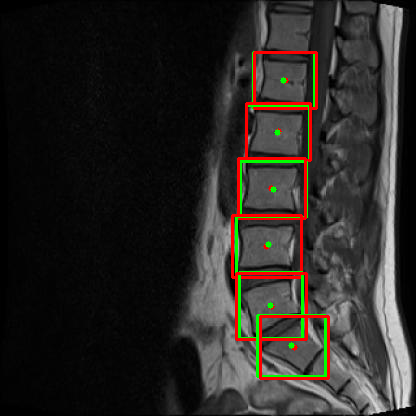

Centre of Original Label 
 270.0 62.5
Centre of Predicted Label 
 270.5 61.0
Distance 
 1.5811388300841898
T1_0271_S8_png_jpg.jpg: 0.8812
Centre of Original Label 
 260.5 118.0
Centre of Predicted Label 
 263.0 117.0
Distance 
 2.692582403567252
T1_0271_S8_png_jpg.jpg: 0.8154
Centre of Original Label 
 253.5 177.5
Centre of Predicted Label 
 254.5 176.0
Distance 
 1.8027756377319946
T1_0271_S8_png_jpg.jpg: 0.9010
Centre of Original Label 
 249.0 234.5
Centre of Predicted Label 
 252.0 235.5
Distance 
 3.1622776601683795
T1_0271_S8_png_jpg.jpg: 0.8640
Centre of Original Label 
 251.0 294.5
Centre of Predicted Label 
 253.0 291.0
Distance 
 4.031128874149275
T1_0271_S8_png_jpg.jpg: 0.7912
Centre of Original Label 
 280.0 332.0
Centre of Predicted Label 
 279.0 333.5
Distance 
 1.8027756377319946
T1_0271_S8_png_jpg.jpg: 0.9245


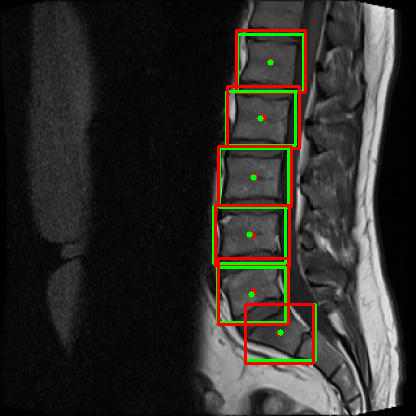

Centre of Original Label 
 265.0 89.5
Centre of Predicted Label 
 266.0 89.5
Distance 
 1.0
T1_0541_S7_png_jpg.jpg: 0.8414
Centre of Original Label 
 253.0 140.5
Centre of Predicted Label 
 254.5 140.5
Distance 
 1.5
T1_0541_S7_png_jpg.jpg: 0.9238
Centre of Original Label 
 239.0 195.0
Centre of Predicted Label 
 242.0 194.0
Distance 
 3.1622776601683795
T1_0541_S7_png_jpg.jpg: 0.8846
Centre of Original Label 
 231.0 248.5
Centre of Predicted Label 
 233.0 249.5
Distance 
 2.23606797749979
T1_0541_S7_png_jpg.jpg: 0.8794
Centre of Original Label 
 234.5 307.5
Centre of Predicted Label 
 236.5 310.0
Distance 
 3.2015621187164243
T1_0541_S7_png_jpg.jpg: 0.8673
Centre of Original Label 
 268.0 342.5
Centre of Predicted Label 
 265.5 345.5
Distance 
 3.905124837953327
T1_0541_S7_png_jpg.jpg: 0.7649


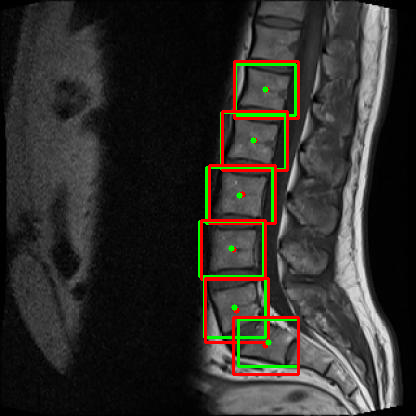

Centre of Original Label 
 285.0 92.0
Centre of Predicted Label 
 284.5 93.5
Distance 
 1.5811388300841898
T1_0215_S8_png_jpg.jpg: 0.8340
Centre of Original Label 
 268.0 141.0
Centre of Predicted Label 
 270.0 138.5
Distance 
 3.2015621187164243
T1_0215_S8_png_jpg.jpg: 0.8620
Centre of Original Label 
 251.5 185.0
Centre of Predicted Label 
 252.5 185.5
Distance 
 1.118033988749895
T1_0215_S8_png_jpg.jpg: 0.7376
Centre of Original Label 
 240.5 237.0
Centre of Predicted Label 
 241.5 237.5
Distance 
 1.118033988749895
T1_0215_S8_png_jpg.jpg: 0.7985
Centre of Original Label 
 242.5 285.5
Centre of Predicted Label 
 244.0 289.5
Distance 
 4.272001872658765
T1_0215_S8_png_jpg.jpg: 0.7761
Centre of Original Label 
 271.5 327.0
Centre of Predicted Label 
 274.5 325.5
Distance 
 3.3541019662496847
T1_0215_S8_png_jpg.jpg: 0.8615


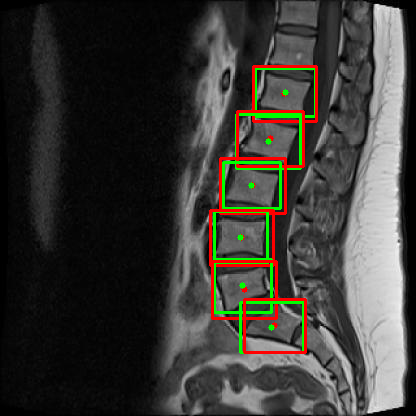

Centre of Original Label 
 294.5 111.0
Centre of Predicted Label 
 299.0 112.5
Distance 
 4.743416490252569
T1_0008_S7_png_jpg.jpg: 0.8095
Centre of Original Label 
 280.0 152.5
Centre of Predicted Label 
 285.0 155.0
Distance 
 5.5901699437494745
T1_0008_S7_png_jpg.jpg: 0.7335
Centre of Original Label 
 266.5 196.0
Centre of Predicted Label 
 270.5 197.5
Distance 
 4.272001872658765
T1_0008_S7_png_jpg.jpg: 0.8072
Centre of Original Label 
 255.5 243.0
Centre of Predicted Label 
 256.5 243.5
Distance 
 1.118033988749895
T1_0008_S7_png_jpg.jpg: 0.9506
Centre of Original Label 
 252.5 289.5
Centre of Predicted Label 
 253.0 293.0
Distance 
 3.5355339059327378
T1_0008_S7_png_jpg.jpg: 0.8142
Centre of Original Label 
 271.0 325.0
Centre of Predicted Label 
 272.0 327.0
Distance 
 2.23606797749979
T1_0008_S7_png_jpg.jpg: 0.8509


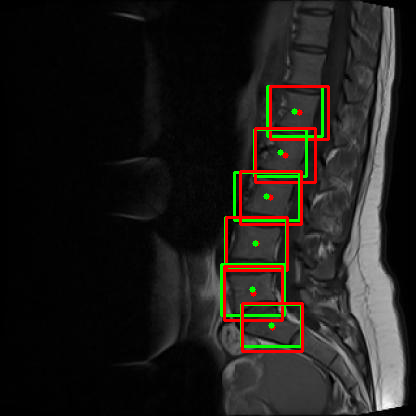

Centre of Original Label 
 252.0 101.0
Centre of Predicted Label 
 252.5 102.0
Distance 
 1.118033988749895
T1_0379_S8_png_jpg.jpg: 0.9003
Centre of Original Label 
 244.0 153.5
Centre of Predicted Label 
 243.0 152.0
Distance 
 1.8027756377319946
T1_0379_S8_png_jpg.jpg: 0.8427
Centre of Original Label 
 240.5 205.5
Centre of Predicted Label 
 239.5 205.0
Distance 
 1.118033988749895
T1_0379_S8_png_jpg.jpg: 0.7969
Centre of Original Label 
 247.5 254.0
Centre of Predicted Label 
 247.0 256.5
Distance 
 2.5495097567963922
T1_0379_S8_png_jpg.jpg: 0.7620
Centre of Original Label 
 266.5 300.5
Centre of Predicted Label 
 269.0 302.0
Distance 
 2.9154759474226504
T1_0379_S8_png_jpg.jpg: 0.8237
Centre of Original Label 
 298.0 323.5
Centre of Predicted Label 
 301.0 327.0
Distance 
 4.6097722286464435
T1_0379_S8_png_jpg.jpg: 0.7761


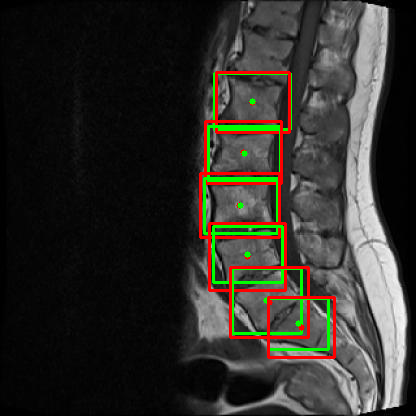

Centre of Original Label 
 252.0 73.5
Centre of Predicted Label 
 254.5 72.0
Distance 
 2.9154759474226504
T1_0174_S7_png_jpg.jpg: 0.8234
Centre of Original Label 
 242.5 121.5
Centre of Predicted Label 
 244.0 122.5
Distance 
 1.8027756377319946
T1_0174_S7_png_jpg.jpg: 0.8609
Centre of Original Label 
 236.0 174.5
Centre of Predicted Label 
 235.5 175.0
Distance 
 0.7071067811865476
T1_0174_S7_png_jpg.jpg: 0.8847
Centre of Original Label 
 227.0 231.5
Centre of Predicted Label 
 226.0 232.0
Distance 
 1.118033988749895
T1_0174_S7_png_jpg.jpg: 0.9233
Centre of Original Label 
 228.0 292.5
Centre of Predicted Label 
 225.0 293.0
Distance 
 3.0413812651491097
T1_0174_S7_png_jpg.jpg: 0.8509
Centre of Original Label 
 253.5 337.0
Centre of Predicted Label 
 251.5 336.5
Distance 
 2.0615528128088303
T1_0174_S7_png_jpg.jpg: 0.7319


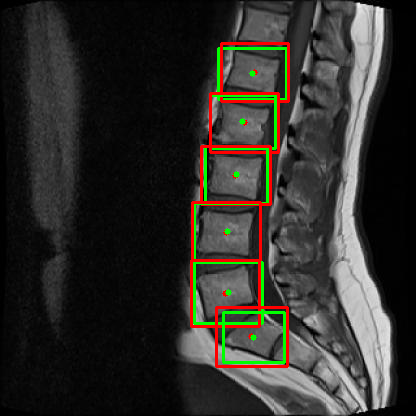

-1

In [ ]:

plus=168
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image

plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image


Centre of Original Label 
 268.0 82.0
Centre of Predicted Label 
 268.5 81.5
Distance 
 0.7071067811865476
T1_0128_S8_png_jpg.jpg: 0.9093
Centre of Original Label 
 257.5 132.5
Centre of Predicted Label 
 260.0 131.5
Distance 
 2.692582403567252
T1_0128_S8_png_jpg.jpg: 0.8951
Centre of Original Label 
 253.5 186.5
Centre of Predicted Label 
 253.0 184.5
Distance 
 2.0615528128088303
T1_0128_S8_png_jpg.jpg: 0.8916
Centre of Original Label 
 251.5 241.5
Centre of Predicted Label 
 250.0 241.5
Distance 
 1.5
T1_0128_S8_png_jpg.jpg: 0.8609
Centre of Original Label 
 253.0 297.5
Centre of Predicted Label 
 253.0 298.0
Distance 
 0.5
T1_0128_S8_png_jpg.jpg: 0.9548
Centre of Original Label 
 273.5 334.0
Centre of Predicted Label 
 275.0 337.5
Distance 
 3.8078865529319543
T1_0128_S8_png_jpg.jpg: 0.7985


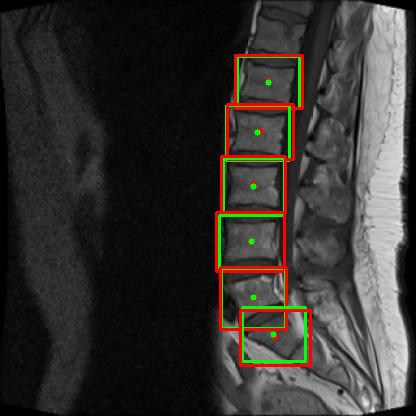

Centre of Original Label 
 262.0 73.5
Centre of Predicted Label 
 262.5 70.5
Distance 
 3.0413812651491097
T1_0568_S8_png_jpg.jpg: 0.8573
Centre of Original Label 
 250.0 121.5
Centre of Predicted Label 
 251.5 117.5
Distance 
 4.272001872658765
T1_0568_S8_png_jpg.jpg: 0.8051
Centre of Original Label 
 240.5 170.0
Centre of Predicted Label 
 243.0 169.0
Distance 
 2.692582403567252
T1_0568_S8_png_jpg.jpg: 0.8935
Centre of Original Label 
 236.5 219.5
Centre of Predicted Label 
 237.0 221.0
Distance 
 1.5811388300841898
T1_0568_S8_png_jpg.jpg: 0.8442
Centre of Original Label 
 239.5 275.5
Centre of Predicted Label 
 242.0 277.0
Distance 
 2.9154759474226504
T1_0568_S8_png_jpg.jpg: 0.8847
Centre of Original Label 
 258.5 314.5
Centre of Predicted Label 
 260.5 319.0
Distance 
 4.924428900898052
T1_0568_S8_png_jpg.jpg: 0.8001


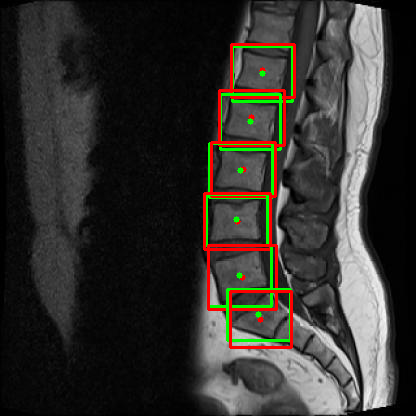

Centre of Original Label 
 276.0 82.0
Centre of Predicted Label 
 275.5 82.0
Distance 
 0.5
T1_0452_S8_png_jpg.jpg: 0.8594
Centre of Original Label 
 260.0 128.0
Centre of Predicted Label 
 260.5 128.0
Distance 
 0.5
T1_0452_S8_png_jpg.jpg: 0.9235
Centre of Original Label 
 245.5 176.0
Centre of Predicted Label 
 247.0 178.0
Distance 
 2.5
T1_0452_S8_png_jpg.jpg: 0.8945
Centre of Original Label 
 236.0 231.5
Centre of Predicted Label 
 237.5 230.0
Distance 
 2.1213203435596424
T1_0452_S8_png_jpg.jpg: 0.8462
Centre of Original Label 
 234.5 283.5
Centre of Predicted Label 
 236.0 286.0
Distance 
 2.9154759474226504
T1_0452_S8_png_jpg.jpg: 0.8786
Centre of Original Label 
 271.0 320.5
Centre of Predicted Label 
 269.0 318.0
Distance 
 3.2015621187164243
T1_0452_S8_png_jpg.jpg: 0.8169


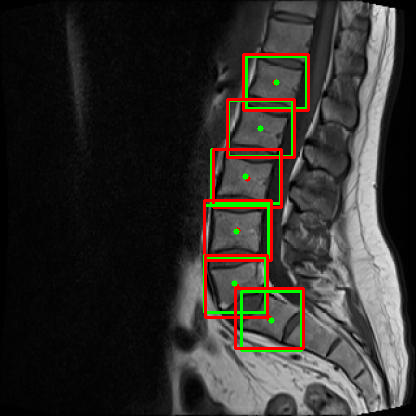

Centre of Original Label 
 221.0 78.0
Centre of Predicted Label 
 222.5 78.5
Distance 
 1.5811388300841898
T1_0569_S8_png_jpg.jpg: 0.9356
Centre of Original Label 
 210.0 127.5
Centre of Predicted Label 
 209.5 127.5
Distance 
 0.5
T1_0569_S8_png_jpg.jpg: 0.8559
Centre of Original Label 
 201.0 175.5
Centre of Predicted Label 
 199.0 180.5
Distance 
 5.385164807134504
T1_0569_S8_png_jpg.jpg: 0.7925
Centre of Original Label 
 199.0 229.5
Centre of Predicted Label 
 201.0 230.0
Distance 
 2.0615528128088303
T1_0569_S8_png_jpg.jpg: 0.9258
Centre of Original Label 
 209.5 279.0
Centre of Predicted Label 
 211.5 280.5
Distance 
 2.5
T1_0569_S8_png_jpg.jpg: 0.8671
Centre of Original Label 
 234.5 317.0
Centre of Predicted Label 
 235.5 316.5
Distance 
 1.118033988749895
T1_0569_S8_png_jpg.jpg: 0.8804


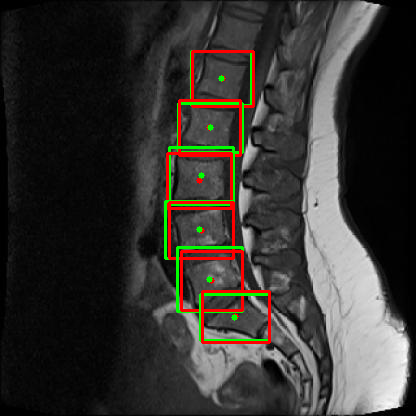

Centre of Original Label 
 279.5 76.5
Centre of Predicted Label 
 279.0 76.5
Distance 
 0.5
T1_0057_S8_png_jpg.jpg: 0.9481
Centre of Original Label 
 269.0 119.5
Centre of Predicted Label 
 268.5 120.5
Distance 
 1.118033988749895
T1_0057_S8_png_jpg.jpg: 0.8250
Centre of Original Label 
 254.0 163.5
Centre of Predicted Label 
 255.5 166.5
Distance 
 3.3541019662496847
T1_0057_S8_png_jpg.jpg: 0.8591
Centre of Original Label 
 241.0 214.5
Centre of Predicted Label 
 243.5 215.5
Distance 
 2.692582403567252
T1_0057_S8_png_jpg.jpg: 0.8643
Centre of Original Label 
 238.0 269.0
Centre of Predicted Label 
 237.0 269.5
Distance 
 1.118033988749895
T1_0057_S8_png_jpg.jpg: 0.8565
Centre of Original Label 
 253.5 310.0
Centre of Predicted Label 
 256.0 313.5
Distance 
 4.301162633521313
T1_0057_S8_png_jpg.jpg: 0.8056


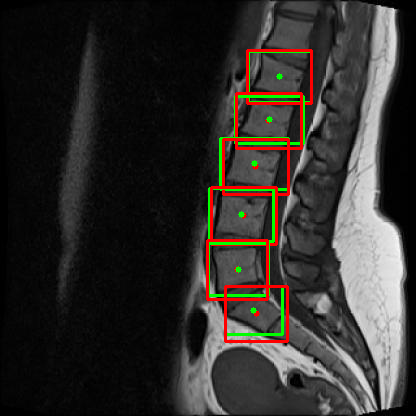

Centre of Original Label 
 265.0 74.5
Centre of Predicted Label 
 266.5 74.5
Distance 
 1.5
T1_0370_S8_png_jpg.jpg: 0.9232
Centre of Original Label 
 256.0 128.0
Centre of Predicted Label 
 258.5 125.5
Distance 
 3.5355339059327378
T1_0370_S8_png_jpg.jpg: 0.8476
Centre of Original Label 
 247.5 180.0
Centre of Predicted Label 
 250.0 180.0
Distance 
 2.5
T1_0370_S8_png_jpg.jpg: 0.8681
Centre of Original Label 
 247.5 237.0
Centre of Predicted Label 
 250.5 237.0
Distance 
 3.0
T1_0370_S8_png_jpg.jpg: 0.9143
Centre of Original Label 
 251.5 292.5
Centre of Predicted Label 
 255.5 290.0
Distance 
 4.716990566028302
T1_0370_S8_png_jpg.jpg: 0.8246
Centre of Original Label 
 276.5 329.5
Centre of Predicted Label 
 279.5 328.0
Distance 
 3.3541019662496847
T1_0370_S8_png_jpg.jpg: 0.8370


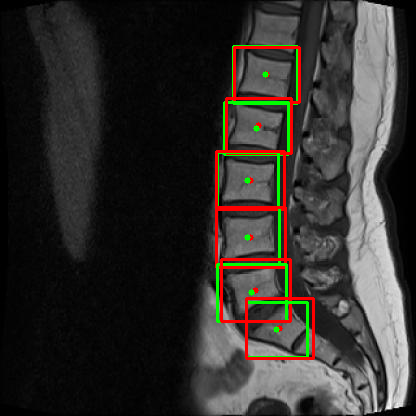

Centre of Original Label 
 248.0 43.5
Centre of Predicted Label 
 248.5 42.0
Distance 
 1.5811388300841898
T1_0363_S8_png_jpg.jpg: 0.8860
Centre of Original Label 
 243.0 101.0
Centre of Predicted Label 
 243.5 98.5
Distance 
 2.5495097567963922
T1_0363_S8_png_jpg.jpg: 0.8579
Centre of Original Label 
 234.5 160.0
Centre of Predicted Label 
 237.5 157.0
Distance 
 4.242640687119285
T1_0363_S8_png_jpg.jpg: 0.8375
Centre of Original Label 
 229.0 217.5
Centre of Predicted Label 
 230.5 217.5
Distance 
 1.5
T1_0363_S8_png_jpg.jpg: 0.8976
Centre of Original Label 
 224.0 280.5
Centre of Predicted Label 
 227.0 281.0
Distance 
 3.0413812651491097
T1_0363_S8_png_jpg.jpg: 0.8034
Centre of Original Label 
 240.5 335.0
Centre of Predicted Label 
 242.0 334.0
Distance 
 1.8027756377319946
T1_0363_S8_png_jpg.jpg: 0.8380


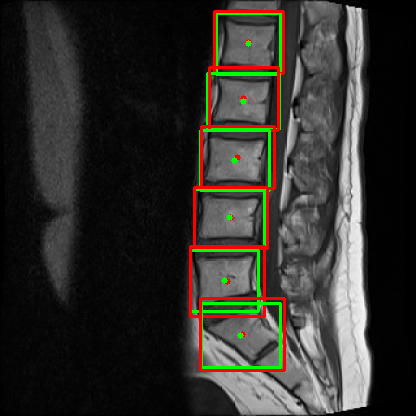

Centre of Original Label 
 243.0 93.0
Centre of Predicted Label 
 243.5 93.0
Distance 
 0.5
T1_0296_S8_png_jpg.jpg: 0.9543
Centre of Original Label 
 226.0 145.0
Centre of Predicted Label 
 229.5 144.0
Distance 
 3.640054944640259
T1_0296_S8_png_jpg.jpg: 0.8787
Centre of Original Label 
 217.0 200.5
Centre of Predicted Label 
 219.0 198.5
Distance 
 2.8284271247461903
T1_0296_S8_png_jpg.jpg: 0.8838
Centre of Original Label 
 218.5 257.0
Centre of Predicted Label 
 218.0 255.0
Distance 
 2.0615528128088303
T1_0296_S8_png_jpg.jpg: 0.9232
Centre of Original Label 
 234.0 310.5
Centre of Predicted Label 
 233.5 310.0
Distance 
 0.7071067811865476
T1_0296_S8_png_jpg.jpg: 0.8219
Centre of Original Label 
 266.5 342.5
Centre of Predicted Label 
 267.0 338.0
Distance 
 4.527692569068709
T1_0296_S8_png_jpg.jpg: 0.8524


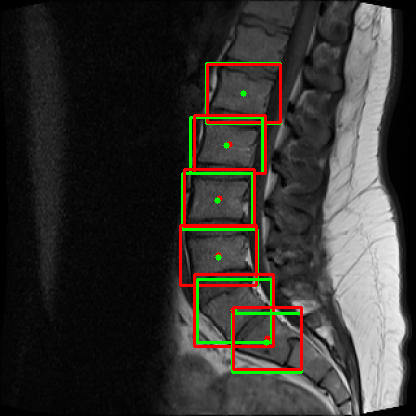

Centre of Original Label 
 210.0 86.5
Centre of Predicted Label 
 210.0 86.5
Distance 
 0.0
T1_0211_S8_png_jpg.jpg: 0.9167
Centre of Original Label 
 195.5 138.5
Centre of Predicted Label 
 196.0 138.0
Distance 
 0.7071067811865476
T1_0211_S8_png_jpg.jpg: 0.8489
Centre of Original Label 
 184.0 193.0
Centre of Predicted Label 
 185.0 194.0
Distance 
 1.4142135623730951
T1_0211_S8_png_jpg.jpg: 0.9105
Centre of Original Label 
 183.0 250.5
Centre of Predicted Label 
 182.0 250.0
Distance 
 1.118033988749895
T1_0211_S8_png_jpg.jpg: 0.9286
Centre of Original Label 
 189.5 307.5
Centre of Predicted Label 
 189.0 307.5
Distance 
 0.5
T1_0211_S8_png_jpg.jpg: 0.8784
Centre of Original Label 
 220.0 341.0
Centre of Predicted Label 
 217.5 341.5
Distance 
 2.5495097567963922
T1_0211_S8_png_jpg.jpg: 0.7235


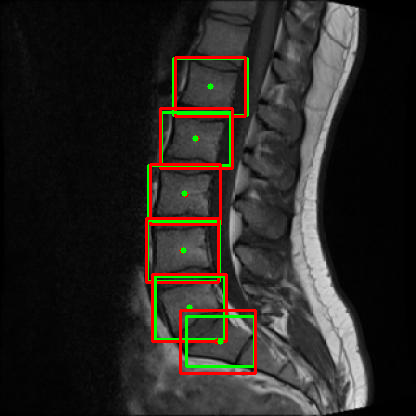

Centre of Original Label 
 255.0 120.5
Centre of Predicted Label 
 256.0 119.5
Distance 
 1.4142135623730951
T1_0173_S7_png_jpg.jpg: 0.8732
Centre of Original Label 
 240.5 156.0
Centre of Predicted Label 
 243.0 157.0
Distance 
 2.692582403567252
T1_0173_S7_png_jpg.jpg: 0.8395
Centre of Original Label 
 228.5 203.0
Centre of Predicted Label 
 227.0 207.0
Distance 
 4.272001872658765
T1_0173_S7_png_jpg.jpg: 0.8319
Centre of Original Label 
 220.5 259.5
Centre of Predicted Label 
 220.0 260.5
Distance 
 1.118033988749895
T1_0173_S7_png_jpg.jpg: 0.8593
Centre of Original Label 
 230.5 319.0
Centre of Predicted Label 
 225.5 317.0
Distance 
 5.385164807134504
T1_0173_S7_png_jpg.jpg: 0.6886
Centre of Original Label 
 255.0 354.5
Centre of Predicted Label 
 257.5 352.5
Distance 
 3.2015621187164243
T1_0173_S7_png_jpg.jpg: 0.7724


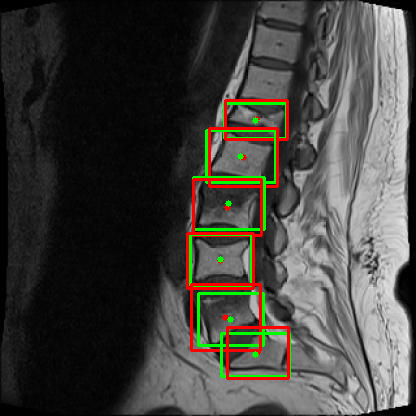

Centre of Original Label 
 212.0 130.0
Centre of Predicted Label 
 215.0 131.0
Distance 
 3.1622776601683795
T1_0196_S8_png_jpg.jpg: 0.7820
Centre of Original Label 
 201.5 173.5
Centre of Predicted Label 
 201.0 173.5
Distance 
 0.5
T1_0196_S8_png_jpg.jpg: 0.8765
Centre of Original Label 
 195.0 218.0
Centre of Predicted Label 
 195.5 218.5
Distance 
 0.7071067811865476
T1_0196_S8_png_jpg.jpg: 0.8473
Centre of Original Label 
 198.5 267.5
Centre of Predicted Label 
 201.0 268.0
Distance 
 2.5495097567963922
T1_0196_S8_png_jpg.jpg: 0.8161
Centre of Original Label 
 215.5 309.0
Centre of Predicted Label 
 219.5 311.0
Distance 
 4.47213595499958
T1_0196_S8_png_jpg.jpg: 0.7497
Centre of Original Label 
 254.0 338.5
Centre of Predicted Label 
 252.0 335.5
Distance 
 3.605551275463989
T1_0196_S8_png_jpg.jpg: 0.6703


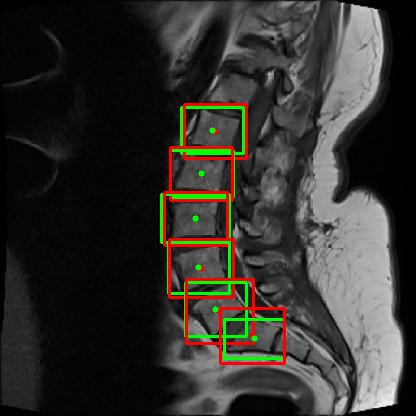

-1

In [ ]:
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
plus=plus+6
#################
j=j+1
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image

In [ ]:
len(kilo)

306

In [ ]:
#EU Mean
L1=[]
L2=[]
L3=[]
L4=[]
L5=[]
S1=[]
eu_L1=0
for i in range(0,306,6):
  eu_L1=eu_L1+kilo[i]
  L1.append(kilo[i])
L1_mean=np.divide(eu_L1,51)
print(L1_mean)
eu_L2=0
for i in range(1,306,6):
  eu_L2=eu_L2+kilo[i]
  L2.append(kilo[i])
L2_mean=np.divide(eu_L2,51)
print(L2_mean)
eu_L3=0
for i in range(2,306,6):
  eu_L3=eu_L3+kilo[i]
  L3.append(kilo[i])
L3_mean=np.divide(eu_L3,51)
print(L3_mean)
eu_L4=0
for i in range(3,306,6):
  eu_L4=eu_L4+kilo[i]
  L4.append(kilo[i])
L4_mean=np.divide(eu_L4,51)
print(L4_mean)
eu_L5=0
for i in range(4,306,6):
  eu_L5=eu_L5+kilo[i]
  L5.append(kilo[i])
L5_mean=np.divide(eu_L5,51)
print(L5_mean)
eu_S1=0
for i in range(5,306,6):
  eu_S1=eu_S1+kilo[i]
  S1.append(kilo[i])
S1_mean=np.divide(eu_S1,51)
print(S1_mean)

0.8786284825834044
0.8731748094381967
0.859940865852926
0.8616128342788864
0.8481726890449841
0.8231592719712676


In [ ]:
len(L1)

51

In [ ]:
#EU STD
#STD
#L1
z=len(L1)
ans_L1=0
for i in L1:
  sub=i-L1_mean
  sub=(sub**2)
  ans_L1=ans_L1+sub
L1_sq=np.divide(ans_L1,z)
L1_sq=sqrt(L1_sq)
print("L1 STD",L1_sq)


#L2
ans_L2=0
for i in L2:
  sub=i-L2_mean
  sub=(sub**2)
  ans_L2=ans_L2+sub
L2_sq=np.divide(ans_L2,z)
L2_sq=sqrt(L2_sq)
print("L2 STD",L2_sq)

#L3
ans_L3=0
for i in L3:
  sub=i-L3_mean
  sub=(sub**2)
  ans_L3=ans_L3+sub
L3_sq=np.divide(ans_L3,z)
L3_sq=sqrt(L3_sq)
print("L3 STD",L3_sq)



#L4
ans_L4=0
for i in L4:
  sub=i-L4_mean
  sub=(sub**2)
  ans_L4=ans_L4+sub
L4_sq=np.divide(ans_L4,z)
L4_sq=sqrt(L4_sq)
print("L4 STD",L4_sq)


#L5
ans_L5=0
for i in L5:
  sub=i-L5_mean
  sub=(sub**2)
  ans_L5=ans_L5+sub
L5_sq=np.divide(ans_L5,z)
L5_sq=sqrt(L5_sq)
print("L5 STD",L5_sq)


#S1
ans_S1=0
for i in S1:
  sub=i-S1_mean
  sub=(sub**2)
  ans_S1=ans_S1+sub
S1_sq=np.divide(ans_S1,z)
S1_sq=sqrt(S1_sq)
print("S1 STD",S1_sq)


L1 STD 0.046576064119716896
L2 STD 0.0561789896448722
L3 STD 0.05518564550728129
L4 STD 0.05387150558130363
L5 STD 0.06755581967837448
S1 STD 0.06198028528479925


In [ ]:
cd /content/sample_data

/content/sample_data


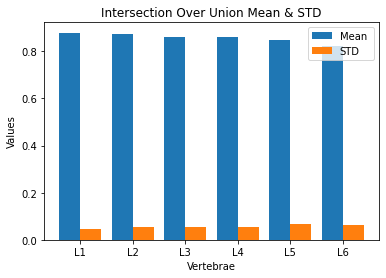

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 
  
X = ['L1','L2','L3','L4','L5','L6']
Ygirls = [0.8786284825834044,
0.8731748094381967,
0.859940865852926,
0.8616128342788864,
0.8481726890449841,
0.8231592719712676]
Zboys = [0.046576064119716896, 
         0.0561789896448722, 
         0.05518564550728129, 
         0.05387150558130363,
         0.06755581967837448,
         0.06198028528479925]
  
X_axis = np.arange(len(X))
  
plt.bar(X_axis - 0.2, Ygirls, 0.4, label = 'Mean ')
plt.bar(X_axis + 0.2, Zboys, 0.4, label = 'STD')
  
plt.xticks(X_axis, X)
plt.xlabel("Vertebrae")
plt.ylabel("Values")
plt.title("Intersection Over Union Mean & STD")
plt.legend()
#plt.show()
plt.savefig('plt_error.png')

In [ ]:
cd /content/drive/MyDrive/test/images

/content/drive/MyDrive/test/images


T1_0298_S7_png_jpg.jpg
Centre of Predicted Label 
 237.5 69.0
Centre of Predicted Label 
 226.5 119.5
Centre of Predicted Label 
 216.5 176.5
Centre of Predicted Label 
 211.5 233.5
Centre of Predicted Label 
 220.0 291.5
Centre of Predicted Label 
 254.0 327.0


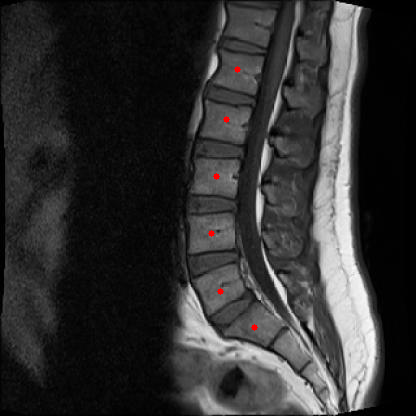

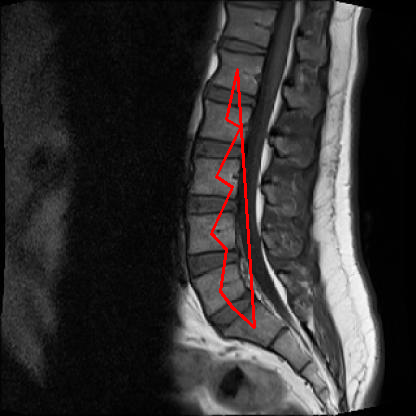

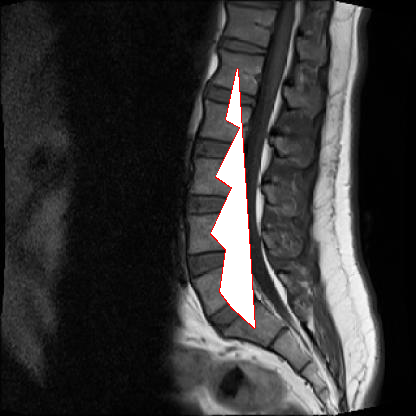

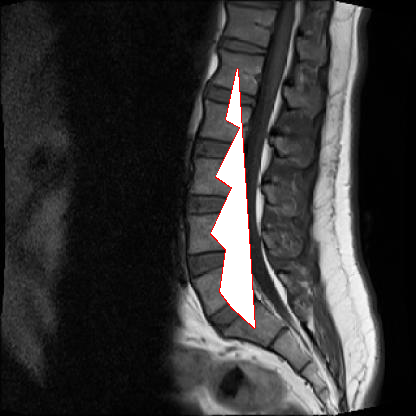

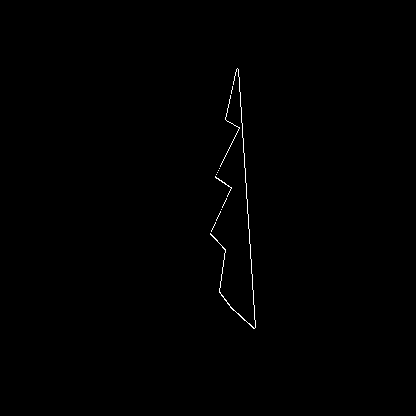

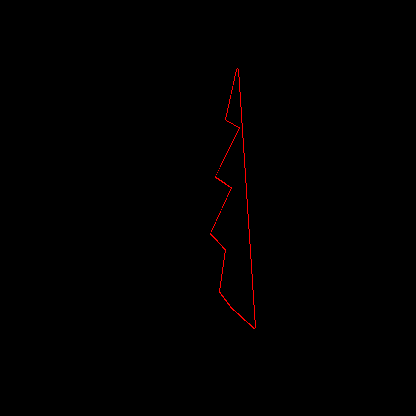

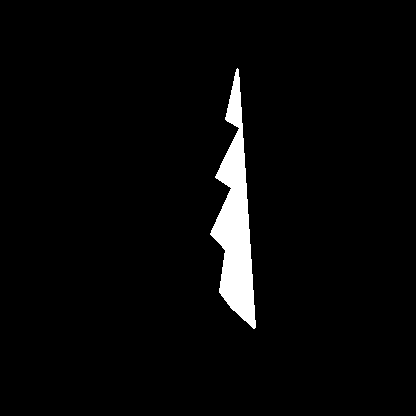

416
416
[(68, 237), (69, 236), (69, 237), (69, 238), (70, 236), (70, 237), (70, 238), (71, 236), (71, 237), (71, 238), (72, 235), (72, 236), (72, 237), (72, 238), (73, 235), (73, 236), (73, 237), (73, 238), (74, 235), (74, 236), (74, 237), (74, 238), (75, 235), (75, 236), (75, 237), (75, 238), (76, 234), (76, 235), (76, 236), (76, 237), (76, 238), (77, 234), (77, 235), (77, 236), (77, 237), (77, 238), (77, 239), (78, 234), (78, 235), (78, 236), (78, 237), (78, 238), (78, 239), (79, 234), (79, 235), (79, 236), (79, 237), (79, 238), (79, 239), (80, 234), (80, 235), (80, 236), (80, 237), (80, 238), (80, 239), (81, 233), (81, 234), (81, 235), (81, 236), (81, 237), (81, 238), (81, 239), (82, 233), (82, 234), (82, 235), (82, 236), (82, 237), (82, 238), (82, 239), (83, 233), (83, 234), (83, 235), (83, 236), (83, 237), (83, 238), (83, 239), (84, 233), (84, 234), (84, 235), (84, 236), (84, 237), (84, 238), (84, 239), (85, 233), (85, 234), (85, 235), (85, 236), (85, 237), (85, 238), (85, 239), (

In [ ]:
plus=0
#plus=plus+6
x_coordinates=[]
y_coordinates=[]
j=0
image=cv2.imread(images[j])
print(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  
cv2_imshow(image)
cv2.waitKey(0) # show the output image


# Python program to explain 
# cv2.polylines() method 
  
import cv2
import numpy as np
  
from google.colab.patches import cv2_imshow
# mode
image = cv2.imread(images[j])
  
# Window name in which image is
# displayed
window_name = 'Image'
  
# Polygon corner points coordinatesx1=[237.5,226.5]

pts=np.array([[x_coordinates[0],y_coordinates[0]],[x_coordinates[1],y_coordinates[1]],[240.5,127.75],[x_coordinates[2],y_coordinates[2]],[234-2,187.25],[ x_coordinates[3],y_coordinates[3]],[228.75-2,249.25],[x_coordinates[4], y_coordinates[4]],[234.5-2,307.5],[x_coordinates[5], y_coordinates[5]]],np.int32)
  

  
isClosed = True
  
# Blue color in BGR
color = (0, 0, 255)
  
# Line thickness of 2 px
thickness = 2
  
# Using cv2.polylines() method
# Draw a Blue polygon with 
# thickness of 1 px
image = cv2.polylines(image, [pts], 
                      isClosed, color, thickness, lineType=8)

cv2_imshow(image)


cv2.drawContours(image,[pts],0,(255,255,255),-1)
cv2_imshow( image)
cv2.waitKey(0)


#blurring and smoothin
img1=image

hsv = cv2.cvtColor(img1,cv2.COLOR_BGR2HSV)

#lower red
lower_red = np.array([0,50,50])
upper_red = np.array([10,255,255])


#upper red
lower_red2 = np.array([170,50,50])
upper_red2 = np.array([180,255,255])

mask = cv2.inRange(hsv, lower_red, upper_red)
res = cv2.bitwise_and(img1,img1, mask= mask)


cv2_imshow(img1)
cv2_imshow(mask)
cv2_imshow(res)

cv2.waitKey(0)
cv2.destroyAllWindows()

binary=cv2.drawContours(mask,[pts],0,(255,255,255),-1)
cv2_imshow( binary)
cv2.waitKey(0)
#cv2.imwrite('img.jpg',binary)
#cv2.destroyAllWindows()


rows,cols=binary.shape
print(rows)
print(cols)
k=0
pixels=[]
for i in range(0,rows):
  for j in range(0,cols):
    if (binary[i,j]!=0):
      pixels.append((i,j))
print(pixels)
len(pixels)

nzCount = cv2.countNonZero(binary)
print(nzCount)

from skimage.io import imread, imshow
from skimage.filters import gaussian, threshold_otsu
from skimage import measure
import matplotlib.pyplot as plt
labels = measure.label(binary)
props = measure.regionprops(labels)
for prop in props:
    print('Label: {} >> Object size: {}'.format(prop.label, prop.area))

T1_0057_S8_png_jpg.jpg
Centre of Predicted Label 
 279.5 76.5
Centre of Predicted Label 
 269.0 119.5
Centre of Predicted Label 
 254.0 163.5
Centre of Predicted Label 
 241.0 214.5
Centre of Predicted Label 
 238.0 269.0
Centre of Predicted Label 
 253.5 310.0


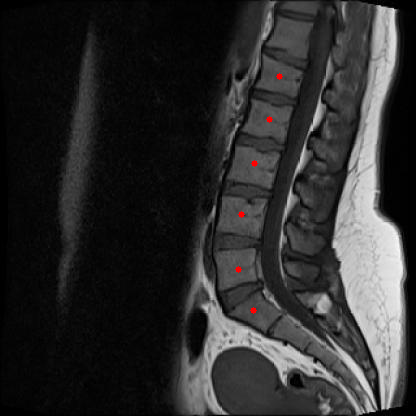

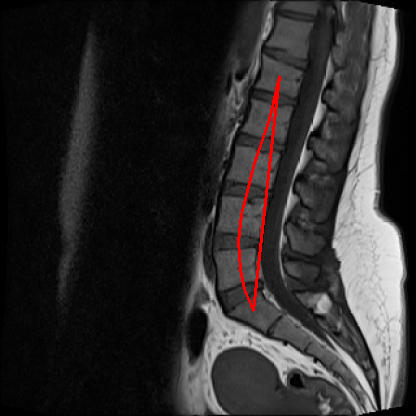

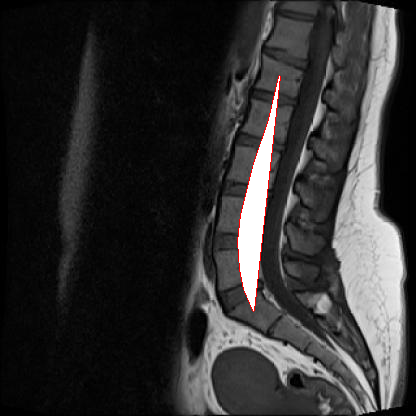

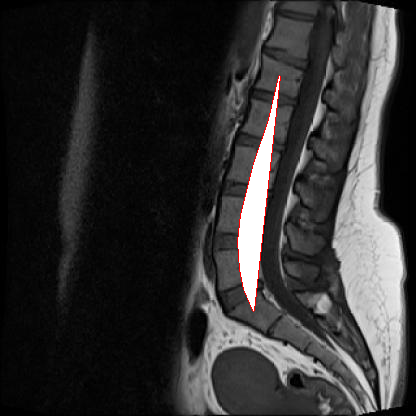

1


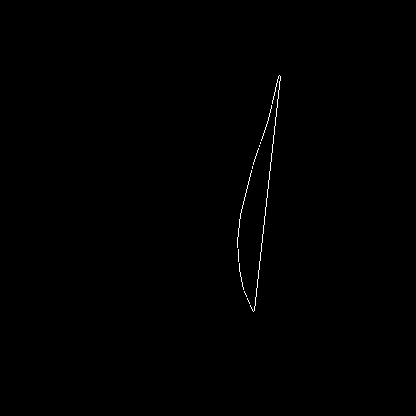

1


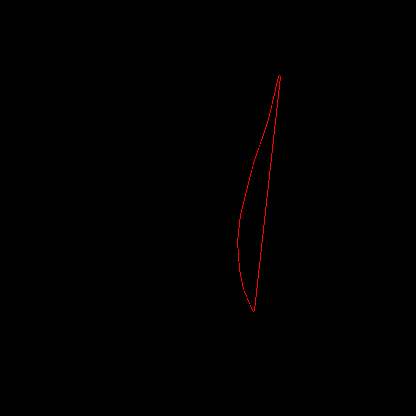

1


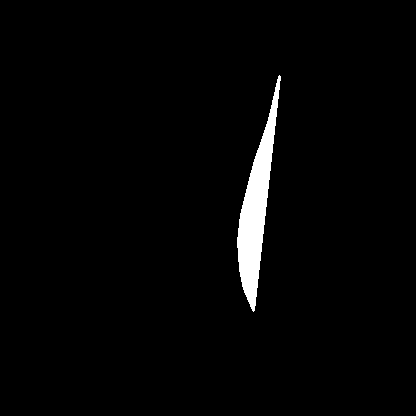

416
416
[(75, 279), (76, 278), (76, 279), (76, 280), (77, 278), (77, 279), (77, 280), (78, 278), (78, 279), (78, 280), (79, 277), (79, 278), (79, 279), (79, 280), (80, 277), (80, 278), (80, 279), (80, 280), (81, 277), (81, 278), (81, 279), (82, 277), (82, 278), (82, 279), (83, 276), (83, 277), (83, 278), (83, 279), (84, 276), (84, 277), (84, 278), (84, 279), (85, 276), (85, 277), (85, 278), (85, 279), (86, 276), (86, 277), (86, 278), (86, 279), (87, 275), (87, 276), (87, 277), (87, 278), (87, 279), (88, 275), (88, 276), (88, 277), (88, 278), (88, 279), (89, 275), (89, 276), (89, 277), (89, 278), (89, 279), (90, 275), (90, 276), (90, 277), (90, 278), (91, 275), (91, 276), (91, 277), (91, 278), (92, 274), (92, 275), (92, 276), (92, 277), (92, 278), (93, 274), (93, 275), (93, 276), (93, 277), (93, 278), (94, 274), (94, 275), (94, 276), (94, 277), (94, 278), (95, 274), (95, 275), (95, 276), (95, 277), (95, 278), (96, 273), (96, 274), (96, 275), (96, 276), (96, 277), (96, 278), (97, 273), (

In [ ]:
plus=264
#plus=plus+6
x_coordinates=[]
y_coordinates=[]
j=44
image=cv2.imread(images[j])
print(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter_o)
  y_coordinates.append(yCenter_o)
  cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 0, 255), thickness=-1)
  print("Centre of Predicted Label \n",xCenter_o,yCenter_o)
  
cv2_imshow(image)
cv2.waitKey(0) # show the output image


# Python program to explain 
# cv2.polylines() method 
  
import cv2
import numpy as np
  
from google.colab.patches import cv2_imshow
# mode
image = cv2.imread(images[j])
  
# Window name in which image is
# displayed
window_name = 'Image'
  
# Polygon corner points coordinatesx1=[237.5,226.5]

pts=np.array([[x_coordinates[0],y_coordinates[0]],[x_coordinates[1],y_coordinates[1]],[x_coordinates[2],y_coordinates[2]],
              #[((x_coordinates[2]+ x_coordinates[3])/2)-1,((y_coordinates[2]+ y_coordinates[3])/2)],
              [ x_coordinates[3],y_coordinates[3]],
              [((x_coordinates[3]+ x_coordinates[4])/2)-1,((y_coordinates[3]+ y_coordinates[4])/2)],
              [x_coordinates[4]+2.5, y_coordinates[4]],
              [((x_coordinates[4]+ x_coordinates[5])/2)-1,((y_coordinates[4]+ y_coordinates[5])/2)],
              [x_coordinates[5], y_coordinates[5]]],np.int32)
  

 #   [((x_coordinates[3]+ x_coordinates[4])/2)-1,((y_coordinates[3]+ y_coordinates[4])/2)]
isClosed = True
  
# Blue color in BGR
color = (0, 0, 255)
  
# Line thickness of 2 px
thickness = 2
  
# Using cv2.polylines() method
# Draw a Blue polygon with 
# thickness of 1 px
image = cv2.polylines(image, [pts], 
                      isClosed, color, thickness, lineType=8)

cv2_imshow(image)


cv2.drawContours(image,[pts],0,(255,255,255),-1)
cv2_imshow( image)
cv2.waitKey(0)


#blurring and smoothin
img1=image

hsv = cv2.cvtColor(img1,cv2.COLOR_BGR2HSV)

#lower red
lower_red = np.array([0,50,50])
upper_red = np.array([10,255,255])


#upper red
lower_red2 = np.array([170,50,50])
upper_red2 = np.array([180,255,255])

mask = cv2.inRange(hsv, lower_red, upper_red)
res = cv2.bitwise_and(img1,img1, mask= mask)


cv2_imshow(img1)
print(1)
cv2_imshow(mask)
print(1)
cv2_imshow(res)
print(1)
cv2.waitKey(0)
cv2.destroyAllWindows()

binary=cv2.drawContours(mask,[pts],0,(255,255,255),-1)
cv2_imshow( binary)
cv2.waitKey(0)
#cv2.imwrite('img.jpg',binary)
#cv2.destroyAllWindows()


rows,cols=binary.shape
print(rows)
print(cols)
k=0
pixels=[]
for i in range(0,rows):
  for j in range(0,cols):
    if (binary[i,j]!=0):
      pixels.append((i,j))
print(pixels)
len(pixels)

nzCount = cv2.countNonZero(binary)
print(nzCount)

from skimage.io import imread, imshow
from skimage.filters import gaussian, threshold_otsu
from skimage import measure
import matplotlib.pyplot as plt
labels = measure.label(binary)
props = measure.regionprops(labels)
for prop in props:
    print('Label: {} >> Object size: {}'.format(prop.label, prop.area))

Centre of Original Label 
 228.0 87.5
Centre of Predicted Label 
 227.5 87.5
Distance 
 0.5
T1_0118_S8_png_jpg.jpg: 0.8979
Centre of Original Label 
 216.0 141.5
Centre of Predicted Label 
 219.0 140.5
Distance 
 3.1622776601683795
T1_0118_S8_png_jpg.jpg: 0.8883
Centre of Original Label 
 209.5 199.0
Centre of Predicted Label 
 211.5 197.5
Distance 
 2.5
T1_0118_S8_png_jpg.jpg: 0.9041
Centre of Original Label 
 208.5 255.0
Centre of Predicted Label 
 209.5 255.0
Distance 
 1.0
T1_0118_S8_png_jpg.jpg: 0.9737
Centre of Original Label 
 212.0 305.0
Centre of Predicted Label 
 212.5 307.5
Distance 
 2.5495097567963922
T1_0118_S8_png_jpg.jpg: 0.8656
Centre of Original Label 
 230.0 347.0
Centre of Predicted Label 
 232.0 349.0
Distance 
 2.8284271247461903
T1_0118_S8_png_jpg.jpg: 0.7634


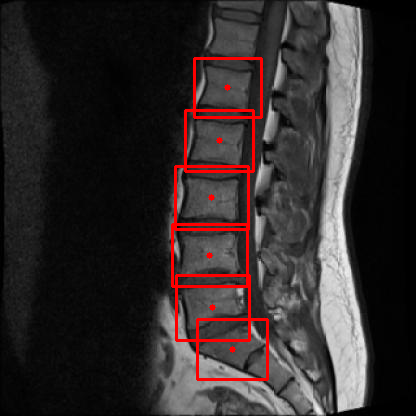

-1

In [ ]:
plus=78
#################
j=13
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  #cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         #cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
cv2_imshow(image)
cv2.waitKey(0) # show the output image

Centre of Original Label 
 193.0 108.5
Centre of Predicted Label 
 193.5 111.0
Distance 
 2.5495097567963922
T1_0143_S8_png_jpg.jpg: 0.9065
Centre of Original Label 
 178.0 157.5
Centre of Predicted Label 
 177.5 159.0
Distance 
 1.5811388300841898
T1_0143_S8_png_jpg.jpg: 0.9352
Centre of Original Label 
 164.5 212.5
Centre of Predicted Label 
 164.0 211.5
Distance 
 1.118033988749895
T1_0143_S8_png_jpg.jpg: 0.9235
Centre of Original Label 
 159.0 267.5
Centre of Predicted Label 
 160.0 267.5
Distance 
 1.0
T1_0143_S8_png_jpg.jpg: 0.8463
Centre of Original Label 
 171.5 320.5
Centre of Predicted Label 
 169.0 322.5
Distance 
 3.2015621187164243
T1_0143_S8_png_jpg.jpg: 0.8791
Centre of Original Label 
 202.0 354.0
Centre of Predicted Label 
 201.0 353.0
Distance 
 1.4142135623730951
T1_0143_S8_png_jpg.jpg: 0.9043


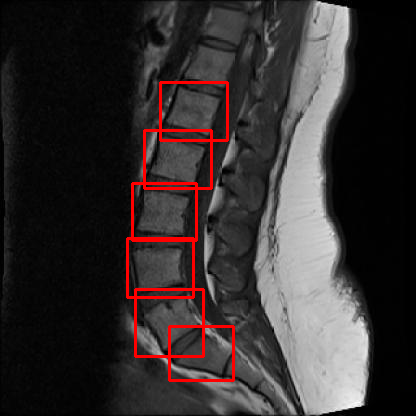

-1

In [ ]:
plus=60
#################
j=10
image=cv2.imread(images[j])
for i in range(6):
  examples = [Detection(images[j], [int(xmn_o[i+plus]), int(ymn_o[i+plus]), int(xmx_o[i+plus]), int(ymx_o[i+plus])], [int(xmn_p[i+plus]),int(ymn_p[i+plus]),int(xmx_p[i+plus]),int(ymx_p[i+plus])] ) ]
  xCenter = np.divide((int(xmn_p[i+plus])) + (int(xmx_p[i+plus])), 2)
  yCenter = np.divide((int(ymn_p[i+plus])) + (int(ymx_p[i+plus])) , 2)
  xCenter_o = np.divide((int(xmn_o[i+plus])) + (int(xmx_o[i+plus])), 2)
  yCenter_o = np.divide((int(ymn_o[i+plus])) + (int(ymx_o[i+plus])) , 2)
  x_coordinates.append(xCenter)
  y_coordinates.append(yCenter)
  x_coordinates_o.append(xCenter_o)
  y_coordinates_o.append(yCenter_o)
  #cv2.circle(image,(int(xCenter),int(yCenter)), radius=3, color=(0, 0, 255), thickness=-1)
  #cv2.circle(image,(int(xCenter_o),int(yCenter_o)), radius=3, color=(0, 255, 0), thickness=-1)
  print("Centre of Original Label \n",xCenter_o,yCenter_o)
  print("Centre of Predicted Label \n",xCenter,yCenter)
  dist=sqrt((xCenter-xCenter_o)**2 + (yCenter-yCenter_o)**2)
  print("Distance \n", dist)
  Eu_dist.append(dist)
  for detection in examples:
         #cv2.rectangle(image, tuple((detection.gt[:2])),tuple((detection.gt[2:])), (0, 255, 0), 2)
         cv2.rectangle(image, tuple(detection.pred[:2]),tuple(detection.pred[2:]), (0, 0, 255), 2)
         iou = bb_intersection_over_union(detection.gt, detection.pred)
         print("{}: {:.4f}".format(detection.image_path, iou))
         kilo.append(iou)
cv2_imshow(image)
cv2.waitKey(0) # show the output image
